# Project 2: 21stcenturyboys

## Group members: Lorenzo Borella, Mattia Ceravolo, Marco Giunta, Samuele Lipani

### Abstract
We studied the SEVN output data for different combinations of the input parameters metallicity Z and common envelope $\alpha$. We initially explored the characteristics of the evolved systems by investigating the distributions of their masses, semi-major axis and eccentricity with respect to the different combinations of Z and $\alpha$. Furthermore, we highlighted the binary systems that happen to merge in a Hubble time in order to study the production of gravitational waves. Eventually we performed a statistical analysis with the aim of understanding the role of Z and $\alpha$ in the merging mechanism of the binary systems.

### Author contribution
In order of appearance:
- *Lorenzo Borella:* Introduction, Preprocessing, Percentage of formed COBs, Study of different configurations, Mass, Semi-major and eccentricity
- *Marco Giunta:* "Merge time computation via numerical integration of Peters equations" & all relevant subsections
- *Mattia Ceravolo:* Study on merging COBs, Primary Mass of the COBs, semi-major axis vs remnant primary and secondary masses, Eccentricity vs Semi-major axis
- *Samuele Pio Lipani:* "Analyzing the relation between $Z$, $\alpha$ and "merger/no merger" using information theory" & all relevant subsections

# Introduction

SEVN simulates the evolution of stellar systems starting from a set of fixed initial parameters. The data gathered in our dataset represent a variety of binary systems and report their main physical parameters both when the stars lie in the main sequence and at some point of their evolution processes.

As we know, single stars may follow different evolution paths according to their initial physical characteristics, therefore binary systems of course involve a series of more complex processes that could change their evolution mechanism. Since there are multiple possibilities for the evolution of the binary systems, the SEVN output dataframe allows us to work with an heterogeneous set and to make some considerations on the processes and on the importance of the parameters involved.

When treating with binary systems, a mass exchange process usually comes into play. This mechanism can occur in several ways (wind mass transfert, Roche lobe overflow, common envelope etc.) therefore is not always easy to forsee the whole lifetime evolution of these systems. Such processes depend on several physical parameters, for example the mass loss by stellar winds can become larger for stars with a higher metallicity value. Moreover, the common envelope formation may modify the rotation dynamics of the binary systems, compromising its possibility to generate measurable gravitational waves. 

By studying the SEVN dataset, we tried to highlight the systems that could eventually become a source of gravitational waves. In the end we retained a small amount of candidate systems with respect to the initial amount of data, since their peculiar characteristics are not common to witness. The observability of these systems in real life is mainly bounded by their evolution time, which is usually greater than the Hubble time. 

All the previous considerations must be taken into account when analyzing the data. In our project we tried to separate the different outcomes of the system's evolution and to infer the importance of Z and $\alpha$ common envelope in such particular processes.

# Importing and distributing the data

With the following commands on the terminal:

dask-scheduler --port PORT &

dask-worker PI:PORT --nprocs 5 --nthreads 4 & 

We take inside the server both a scheduler and the workers from which we will use Dask. Since the data was generated by 10 workes and stored in 10 files we will use 10 workers too to read them.

In [2]:
client.close()
#%bash
#dask-scheduler --port PORT &
#dask-worker 193.206.241.241:PORT --nprocs 5 --nthreads 4 & 

In [3]:
from distributed import Client
client = Client() #IP:PORT '193.206.241.241:1998'
client

Client Scheduler: tcp://127.0.0.1:34716 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 8 Cores: 64 Memory: 270.36 GB


The data are distributed among different folders, each one corresponding to a specific combination of Z and $\alpha$. The files inside these folders report the evolution parameters of multiple stellar systems generated by SEVN simulation.

In the following cell we are reading and collecting all the "output.csv" and "evolved.dat" files inside two Dask dataframes. These dataframes contain all the amount of data at our disposal; they will be filtered and studied according to different requirements in order to make some considerations in the following sections of our project.

Together with the actual data, we inserted the Z and A columns in the dataframe in order to collect and store the Z and $\alpha$ informations for each system. Z and A have a set of unique values respectively [0.002, 0.002, 0.02] and [0.1, 1, 5] and all the systems in our data correspond to one of all the possible combination of these values.


In [4]:
import os
import dask
import pandas as pd
import dask.dataframe as dd
import numpy as np
from glob import iglob
import pandas as pd

# start to read a series of CSV
dfs = []

Zs = {'00002':0.0002, '0002':0.002, '002':0.02} #Metallicity
As = {'01':0.1, '1':1, '5':5} #alpha common envelope

for z in Zs:
    for a in As:
        df = dd.read_csv(
            os.path.join('/tank1/comp_phys/21stcentury/project2/sevn_output_Z'+z+'A'+a
                         +'QH', 'output_*.csv')) #metallicities and alphas are inside the filename
        df['Z'] = Zs[z]
        df['A'] = As[a]
        dfs.append(df)

df = dd.concat(dfs) #output dataframe

dfs = []
for z in Zs:
    for a in As:
        df1 = dd.read_csv(
            os.path.join('/tank1/comp_phys/21stcentury/project2/sevn_output_Z'+z+'A'+a
                         +'QH', 'evolved_*.dat'),
            delim_whitespace = True) #metallicities and alphas are inside the name file
        df1['Z'] = Zs[z]
        df1['A'] = As[a]
        dfs.append(df1)

df_input = dd.concat(dfs)
df_input.columns = ["ID", *df_input.columns[1:]] #input dataframe

N = int(len(df)) 

The rows of the output dataframe are coupled two by two with same ID and name columns: the first one of the pair is the binary system at time 0, when the stars are in the Main Squence, the second one is the same system at the end of the simulation, when the binary system is a single star or a COB.

In [5]:
print("Number of systems in the output dataframe:", len(df))
print("Number of systems in the evolved dataframe:", len(df_input))

print("Head of output dataframe:")
display(df.head(10))

print("Head of evolved dataframe:")
display(df_input.head(10))

Number of systems in the output dataframe: 18018000
Number of systems in the evolved dataframe: 9009000
Head of output dataframe:


,ID,name,Mass_0,Luminosity_0,Radius_0,Temperature_0,Phase_0,RemnantType_0,Zams_0,Mass_1,...,Phase_1,RemnantType_1,Zams_1,Semimajor,Eccentricity,BWorldtime,BTimestep,GWtime,Z,A
0,0,505677749526079,5.140904,801.851100,1.660367,23857.31,1,0,5.141000,4.319217,...,1,0,4.319300,188.45200,0.3954,0.00000,0.000000e+00,4.964873e+08,0.0002,0.1
1,0,505677749526079,0.918336,10.956190,0.008755,112330.50,7,2,5.118205,NaN,...,7,-1,4.319300,NaN,NaN,84.10360,2.000018e-10,NaN,0.0002,0.1
2,1,495263899355111,8.435113,3819.161000,2.293992,29984.45,1,0,8.435200,4.205319,...,1,0,4.205400,96.30133,0.3944,0.00000,0.000000e+00,1.591277e+07,0.0002,0.1
3,1,495263899355111,1.304684,2.387996,0.000014,1894173.00,7,4,8.180010,NaN,...,7,-1,7.365325,NaN,NaN,32.86350,2.000018e-10,NaN,0.0002,0.1
4,2,281609629053902,13.471740,15244.960000,3.088102,36528.83,1,0,13.471800,10.955180,...,1,0,10.955200,97.78154,0.0080,0.00000,0.000000e+00,3.800848e+06,0.0002,0.1
5,2,281609629053902,1.238813,2.306927,0.000014,1877888.00,7,5,13.501720,NaN,...,7,-1,10.955200,NaN,NaN,15.80781,1.999982e-10,NaN,0.0002,0.1
6,3,136641911126985,8.872474,4466.072000,2.366953,30696.35,1,0,8.872500,5.978988,...,1,0,5.979100,15.84773,0.1394,0.00000,0.000000e+00,1.120624e+04,0.0002,0.1
7,3,136641911126985,1.235519,2.302836,0.000014,1877055.00,7,5,8.872561,NaN,...,7,-1,6.254709,NaN,NaN,30.00796,1.999982e-10,NaN,0.0002,0.1
8,4,929105171279632,17.095960,29264.430000,3.577401,39948.57,1,0,17.096100,8.121169,...,1,0,8.121300,279.66310,0.0121,0.00000,0.000000e+00,2.618019e+08,0.0002,0.1
9,4,929105171279632,1.727750,2.879631,0.000014,1984931.00,7,5,5.951167,NaN,...,7,-1,8.121300,NaN,NaN,32.06990,1.000000e+30,NaN,0.0002,0.1


Head of evolved dataframe:


,ID,name,Mass_0,Z_0,spin_0,SN_0,Tstart_0,Mass_1,Z_1,spin_1,SN_1,Tstart_1,a,e,Tend,Dtout,Seed,Z,A
0,0,505677749526079,5.1410,0.0002,0.0,delayed,zams,4.3193,0.0002,0.0,delayed,zams,188.452010,0.3954,end,end,2037559752,0.0002,0.1
1,1,495263899355111,8.4352,0.0002,0.0,delayed,zams,4.2054,0.0002,0.0,delayed,zams,96.301327,0.3944,end,end,1452206127,0.0002,0.1
2,2,281609629053902,13.4718,0.0002,0.0,delayed,zams,10.9552,0.0002,0.0,delayed,zams,97.781539,0.0080,end,end,921775394,0.0002,0.1
3,3,136641911126985,8.8725,0.0002,0.0,delayed,zams,5.9791,0.0002,0.0,delayed,zams,15.847727,0.1394,end,end,3730658277,0.0002,0.1
4,4,929105171279632,17.0961,0.0002,0.0,delayed,zams,8.1213,0.0002,0.0,delayed,zams,279.663105,0.0121,end,end,639191187,0.0002,0.1
5,5,101931734175490,16.3125,0.0002,0.0,delayed,zams,4.4385,0.0002,0.0,delayed,zams,472.882418,0.1556,end,end,3321240787,0.0002,0.1
6,6,609677783323193,9.3025,0.0002,0.0,delayed,zams,8.4500,0.0002,0.0,delayed,zams,246.117448,0.0572,end,end,4046217782,0.0002,0.1
7,7,199298707740420,68.9206,0.0002,0.0,delayed,zams,33.7200,0.0002,0.0,delayed,zams,72.607636,0.0870,end,end,3762750498,0.0002,0.1
8,8,753070920484138,6.3718,0.0002,0.0,delayed,zams,4.3992,0.0002,0.0,delayed,zams,3532.119048,0.0344,end,end,623955070,0.0002,0.1
9,9,180252894129475,12.2243,0.0002,0.0,delayed,zams,7.9158,0.0002,0.0,delayed,zams,40.254370,0.6488,end,end,893405861,0.0002,0.1


# Preprocessing

Firstly, we select the data corresponding to binary systems at the end of the simulation by requiring "BWorldtime" > 0; this allows us to work separately on the initial and final state parameters of the systems.

We will search only for determined conditions on the properties of the system at the end of the simulation. So we remove the first row of each couple and we will retrive them after.

In [6]:
#select only final events
df_end = df[df["BWorldtime"] > 0].copy()

print('Number of Events at the end of the simulation:', len(df_end))
df_end.head(10)

Number of Events at the end of the simulation: 9009000


,ID,name,Mass_0,Luminosity_0,Radius_0,Temperature_0,Phase_0,RemnantType_0,Zams_0,Mass_1,...,Phase_1,RemnantType_1,Zams_1,Semimajor,Eccentricity,BWorldtime,BTimestep,GWtime,Z,A
1,0,505677749526079,0.918336,1.095619e+01,0.008755,1.123305e+05,7,2,5.118205,NaN,...,7,-1,4.319300,NaN,NaN,84.103600,2.000018e-10,NaN,0.0002,0.1
3,1,495263899355111,1.304684,2.387996e+00,0.000014,1.894173e+06,7,4,8.180010,NaN,...,7,-1,7.365325,NaN,NaN,32.863500,2.000018e-10,NaN,0.0002,0.1
5,2,281609629053902,1.238813,2.306927e+00,0.000014,1.877888e+06,7,5,13.501720,NaN,...,7,-1,10.955200,NaN,NaN,15.807810,1.999982e-10,NaN,0.0002,0.1
7,3,136641911126985,1.235519,2.302836e+00,0.000014,1.877055e+06,7,5,8.872561,NaN,...,7,-1,6.254709,NaN,NaN,30.007960,1.999982e-10,NaN,0.0002,0.1
9,4,929105171279632,1.727750,2.879631e+00,0.000014,1.984931e+06,7,5,5.951167,NaN,...,7,-1,8.121300,NaN,NaN,32.069900,1.000000e+30,NaN,0.0002,0.1
11,5,101931734175490,1.624523,2.761665e+00,0.000014,1.964283e+06,7,5,5.567041,NaN,...,7,-1,4.438500,NaN,NaN,102.049900,1.000000e+30,NaN,0.0002,0.1
13,6,609677783323193,1.235519,2.302836e+00,0.000014,1.877055e+06,7,5,9.309962,NaN,...,7,-1,8.450000,NaN,NaN,27.742970,1.999982e-10,NaN,0.0002,0.1
15,7,199298707740420,59.899550,1.000000e-15,0.000254,6.440680e+01,7,6,68.687110,NaN,...,7,-1,37.522610,NaN,NaN,3.788706,2.000000e-10,NaN,0.0002,0.1
17,8,753070920484138,1.095682,1.299351e+01,0.006765,1.333545e+05,7,2,6.371800,0.875995,...,7,2,4.720529,15536.57,0.018663,107.779800,2.000018e-10,4.610326e+18,0.0002,0.1
19,9,180252894129475,1.235519,2.302836e+00,0.000014,1.877055e+06,7,5,12.189520,NaN,...,7,-1,7.915800,NaN,NaN,18.072520,1.999982e-10,NaN,0.0002,0.1


We will search only for stars that at the end of the simulations form a COB, therefore we select the lines in the dataframe that report a numerical value for "Mass_1"; all the other non-selected lines represent a systems that are no longer considerable binary inside the timespan of the simulation.

In [7]:
#not merged stars and merged stars
df_end_nm = df_end[~np.isnan(df_end['Mass_1'])].copy()

print("Number of events:",len(df_end_nm))
display(df_end_nm.head(10))


Number of events: 3280560


,ID,name,Mass_0,Luminosity_0,Radius_0,Temperature_0,Phase_0,RemnantType_0,Zams_0,Mass_1,...,Phase_1,RemnantType_1,Zams_1,Semimajor,Eccentricity,BWorldtime,BTimestep,GWtime,Z,A
17,8,753070920484138,1.095682,1.299351e+01,0.006765,1.333545e+05,7,2,6.3718,0.875995,...,7,2,4.720529,15536.5700,1.866322e-02,107.779800,2.000018e-10,4.610326e+18,0.0002,0.1
23,11,988191227358948,1.235519,2.302836e+00,0.000014,1.877055e+06,7,5,8.4040,1.130462,...,7,2,6.605300,NaN,NaN,51.175560,2.000018e-10,NaN,0.0002,0.1
27,13,827090658090927,1.235519,2.302836e+00,0.000014,1.877055e+06,7,5,11.4376,1.080065,...,7,2,6.309600,NaN,NaN,55.623770,2.000018e-10,NaN,0.0002,0.1
31,15,390700554071833,28.121670,1.000000e-15,0.000100,1.027102e+02,7,6,30.6323,1.369616,...,7,1,1.563061,674.1479,1.053671e-08,40.613270,2.000000e-10,2.726147e+10,0.0002,0.1
33,16,690818120055490,28.138450,1.000000e-15,0.000120,9.397090e+01,7,6,32.2770,11.319390,...,7,6,24.757200,NaN,NaN,8.117717,2.000000e-10,NaN,0.0002,0.1
37,18,962831756045017,1.103784,1.312013e+01,0.006635,1.349758e+05,7,2,6.4359,0.787917,...,7,2,3.590099,3645.1700,2.739980e-02,200.757100,1.999876e-10,1.604630e+16,0.0002,0.1
39,19,888096657756170,1.098782,1.279053e+01,0.006970,1.308595e+05,7,2,6.2547,0.837053,...,7,2,4.216386,5775.8280,5.761156e-02,144.597000,1.999876e-10,9.262602e+16,0.0002,0.1
41,20,100116281028580,1.520520,2.644589e+00,0.000014,1.943125e+06,7,5,15.8746,1.235519,...,7,5,8.692700,NaN,NaN,31.197530,1.999982e-10,NaN,0.0002,0.1
43,21,327968190604942,1.235519,2.302836e+00,0.000014,1.877055e+06,7,5,12.1301,0.890363,...,7,2,4.874700,NaN,NaN,93.925990,2.000018e-10,NaN,0.0002,0.1
47,23,503106112818618,1.235519,2.302836e+00,0.000014,1.877055e+06,7,5,9.5611,1.290512,...,7,4,8.041300,NaN,NaN,35.507110,2.000018e-10,NaN,0.0002,0.1


We are interested only in the binary systems of Black Holes and/or Neutron Stars, therefore we are making a further selection on the types of remnants we are dealing with.

Eventually we retained only the 2.6% of the original amount of data.


In [8]:
#only certain Remnant types
df_end_interest_nm = df_end_nm[df_end_nm["RemnantType_0"].isin([4,5,6])].copy()
df_end_interest_nm = df_end_interest_nm[df_end_interest_nm["RemnantType_1"].isin([4,5,6])].copy()
df_end_interest_nm = df_end_interest_nm.dropna()

print("Number of events:", len(df_end_interest_nm))
print("Percentage wrt orignal dataset:", len(df_end_interest_nm)*2/N)
display(df_end_interest_nm.head(10))

Number of events: 230050
Percentage wrt orignal dataset: 0.025535575535575537


,ID,name,Mass_0,Luminosity_0,Radius_0,Temperature_0,Phase_0,RemnantType_0,Zams_0,Mass_1,...,Phase_1,RemnantType_1,Zams_1,Semimajor,Eccentricity,BWorldtime,BTimestep,GWtime,Z,A
185,92,623198111468628,43.89820,1.000000e-15,0.000186,75.23506,7,6,44.67820,26.74879,...,7,6,31.79180,8218.0870,0.933191,6.255643,2.000000e-10,6.382552e+09,0.0002,0.1
225,112,586465437076249,23.04844,1.000000e-15,0.000098,103.90500,7,6,26.01399,27.23231,...,7,6,30.98894,134.8864,0.009944,4.975206,2.000000e-10,1.572015e+06,0.0002,0.1
249,124,214297123674238,36.25998,1.000000e-15,0.000154,82.86009,7,6,43.63717,32.66218,...,7,6,37.74799,481.9433,0.012562,4.733170,2.000000e-10,9.903180e+07,0.0002,0.1
309,154,559548692536031,38.30607,1.000000e-15,0.000163,80.53965,7,6,86.13720,56.34101,...,7,6,57.45690,80356.4100,0.095792,4.171837,2.000000e-10,2.963007e+16,0.0002,0.1
361,180,424791614019654,17.22931,1.000000e-15,0.000073,120.21590,7,6,19.27244,17.39733,...,7,6,19.51988,109.5645,0.014440,6.984805,2.000000e-10,2.080002e+06,0.0002,0.1
565,282,453175622970023,21.07445,1.000000e-15,0.000089,108.67340,7,6,23.74248,28.13940,...,7,6,32.04603,206.1994,0.010160,5.001977,2.000000e-10,9.283168e+06,0.0002,0.1
597,298,886120093649027,24.06529,1.000000e-15,0.000102,101.71670,7,6,27.21070,24.78066,...,7,6,28.11338,159.2843,0.010236,5.472649,2.000000e-10,3.311789e+06,0.0002,0.1
631,315,182212012175249,25.97766,1.000000e-15,0.000110,97.80107,7,6,31.51780,20.81434,...,7,6,29.53060,8975.5540,0.322961,6.632123,2.000000e-10,2.615384e+13,0.0002,0.1
639,319,496823139436782,53.84900,1.000000e-15,0.000229,67.92892,7,6,54.88230,46.34933,...,7,6,47.17380,79727.0900,0.558309,4.698288,2.000000e-10,6.552494e+15,0.0002,0.1
653,326,989187647509156,40.50679,1.000000e-15,0.000172,78.34569,7,6,51.34225,40.70079,...,7,6,51.85701,960.6477,0.059828,3.675112,2.000000e-10,9.417614e+08,0.0002,0.1


For simplicity we added a "type" column in the dataframe; it allowed us to easily identify the types of selected binary systems such as BH-BH, BH-NS, NS-BH and NS-NS. We will use this information in the following to properly plot the distributions of such systems and study their different parameters.

In [9]:
def map_type(df):
    
    if df['RemnantType_0'].values[0] == 6: df['type'] = 'BH-'
    else: df['type'] = 'NS-'
        
    if df['RemnantType_1'].values[0] == 6:df['type'] += 'BH'
    else:df['type'] += 'NS'
        
    return df

#add the type column
df_end_interest_nm = df_end_interest_nm.map_partitions(map_type)

Eventually we transform the final Dask data frame in a Pandas data frame, since the amount of interesting data has been considerably reduced and since Pandas functions make our data more accessible.

In [10]:
df_end_interest_nm = df_end_interest_nm.compute().reset_index(drop=True)

This is the final dataframe that contains all the informations on the COBs at the end of the simulation.

In [11]:
df_end_interest_nm

,ID,name,Mass_0,Luminosity_0,Radius_0,Temperature_0,Phase_0,RemnantType_0,Zams_0,Mass_1,...,RemnantType_1,Zams_1,Semimajor,Eccentricity,BWorldtime,BTimestep,GWtime,Z,A,type
0,92,623198111468628,43.898200,1.000000e-15,0.000186,75.23506,7,6,44.67820,26.748790,...,6,31.791800,8218.0870,0.933191,6.255643,2.000000e-10,6.382552e+09,0.0002,0.1,BH-BH
1,112,586465437076249,23.048440,1.000000e-15,0.000098,103.90500,7,6,26.01399,27.232310,...,6,30.988940,134.8864,0.009944,4.975206,2.000000e-10,1.572015e+06,0.0002,0.1,BH-BH
2,124,214297123674238,36.259980,1.000000e-15,0.000154,82.86009,7,6,43.63717,32.662180,...,6,37.747990,481.9433,0.012562,4.733170,2.000000e-10,9.903180e+07,0.0002,0.1,BH-BH
3,154,559548692536031,38.306070,1.000000e-15,0.000163,80.53965,7,6,86.13720,56.341010,...,6,57.456900,80356.4100,0.095792,4.171837,2.000000e-10,2.963007e+16,0.0002,0.1,BH-BH
4,180,424791614019654,17.229310,1.000000e-15,0.000073,120.21590,7,6,19.27244,17.397330,...,6,19.519880,109.5645,0.014440,6.984805,2.000000e-10,2.080002e+06,0.0002,0.1,BH-BH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230045,899694,430764938470682,8.034107,1.000000e-15,0.000034,176.19630,7,6,17.49480,6.209679,...,6,15.720420,2286.6000,0.247431,5.506292,2.000000e-10,4.623389e+12,0.0200,5.0,BH-BH
230046,899795,931971495385373,15.378850,1.000000e-15,0.000065,127.11050,7,6,100.42560,15.113400,...,6,96.932100,10003.8200,0.132846,3.315733,2.000000e-10,1.990603e+14,0.0200,5.0,BH-BH
230047,899879,158937381720381,14.039520,1.000000e-15,0.000060,133.04060,7,6,81.94600,1.235519,...,5,3.711674,433.0090,0.511304,13.406500,2.000000e-10,6.887031e+09,0.0200,5.0,BH-BH
230048,899888,161831677695017,4.364386,1.000000e-15,0.000019,238.61120,7,6,13.42219,1.235519,...,5,4.082497,349.3680,0.584510,12.611660,2.000000e-10,1.712514e+10,0.0200,5.0,BH-BH


We created another dataframe by selecting the rows in the "evolved" data that corresponded to the previously selected systems: in this way we are treating in a parallel fashion the parameter informations of the same systems both at the  beginning and at the end of the simulation.



In [12]:
df_start_interest_nm = df_input[(df_input.astype({'ID': str}).ID
                                 +df_input.astype({'Z': str}).Z
                                 +df_input.astype({'A': str}).A).isin(np.array(df_end_interest_nm.astype({'ID': str}).ID
                                                                               +df_end_interest_nm.astype({'Z': str}).Z
                                                                               +df_end_interest_nm.astype({'A': str}).A))]

As fot the df_end_interest_nm dataframe we transform the df_start_interest_nm dataframe in a Pandas dataframe just for simplicity. We also add to it the previously derived "type" informations.

In [13]:
df_start_interest_nm = df_start_interest_nm.compute()
df_start_interest_nm = df_start_interest_nm.reset_index(drop=True)
df_start_interest_nm['type'] = df_end_interest_nm['type']

print("Number of events:", len(df_start_interest_nm))
df_start_interest_nm

Number of events: 230050


,ID,name,Mass_0,Z_0,spin_0,SN_0,Tstart_0,Mass_1,Z_1,spin_1,SN_1,Tstart_1,a,e,Tend,Dtout,Seed,Z,A,type
0,92,623198111468628,44.6782,0.0002,0.0,delayed,zams,31.7918,0.0002,0.0,delayed,zams,10535.057562,0.6549,end,end,1161149332,0.0002,0.1,BH-BH
1,112,586465437076249,54.3871,0.0002,0.0,delayed,zams,39.8539,0.0002,0.0,delayed,zams,156.346414,0.5890,end,end,725385068,0.0002,0.1,BH-BH
2,124,214297123674238,79.4321,0.0002,0.0,delayed,zams,40.5089,0.0002,0.0,delayed,zams,403.307418,0.1733,end,end,3809885241,0.0002,0.1,BH-BH
3,154,559548692536031,86.1372,0.0002,0.0,delayed,zams,57.4569,0.0002,0.0,delayed,zams,59437.022908,0.3420,end,end,1430491909,0.0002,0.1,BH-BH
4,180,424791614019654,41.2725,0.0002,0.0,delayed,zams,24.6824,0.0002,0.0,delayed,zams,90.369278,0.2729,end,end,1861904167,0.0002,0.1,BH-BH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230045,899694,430764938470682,43.7602,0.0200,0.0,delayed,zams,34.1082,0.0200,0.0,delayed,zams,6372.382477,0.8931,end,end,1787891138,0.0200,5.0,BH-BH
230046,899795,931971495385373,100.4256,0.0200,0.0,delayed,zams,96.9321,0.0200,0.0,delayed,zams,1644.457603,0.1584,end,end,3166553709,0.0200,5.0,BH-BH
230047,899879,158937381720381,81.9460,0.0200,0.0,delayed,zams,14.9845,0.0200,0.0,delayed,zams,446.826892,0.7420,end,end,954090574,0.0200,5.0,BH-BH
230048,899888,161831677695017,36.6835,0.0200,0.0,delayed,zams,15.2370,0.0200,0.0,delayed,zams,1242.749887,0.2999,end,end,3586783801,0.0200,5.0,BH-BH


## Fraction of formed COBs

In the graph below we reported the fraction of the number of remnant COBs at the end of the simulation, with respect to the different values of Z and A, divided by the number of initial binary systems in our dataframe. 

This plot is just made to represent the distribution of the so far selected events with respect to the $\alpha$ common envelope and metallicity parameters. Since we are looking for binary systems that could lead to GW productions, we decided to investigate which fraction of the original dataset and which combination of Z and A could lead to the required conditions.

The distribution of the COBs shows that it's more probable to find massive remnants when the value of Z is decreasing and when the value of $\alpha$ is increasing, even though this monotonic behaviour is inverted for Z=0.02.

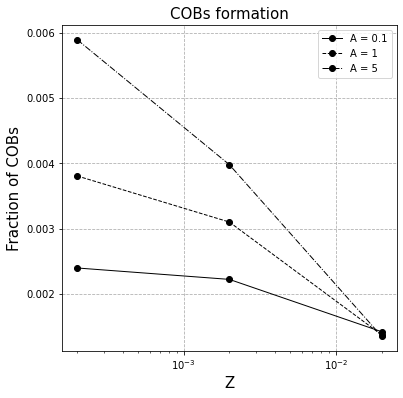

In [14]:
import matplotlib.pyplot as plt

#n of COBs per each combination of Z and A
n_cobs = df_end_interest_nm.groupby(['A','Z'])['ID'].count()*2/N

fig, ax = plt.subplots(figsize = (6,6))
lss = ['-', '--', '-.']

Z = [0.0002, 0.002, 0.02] #Metallicity
A = [0.1, 1, 5] #alpha common envelope

for i in range(3):
    
    x = n_cobs.loc[A[i]].index.values
    y = n_cobs.loc[A[i]].values

    ax.set_title('COBs formation', fontsize = 15)
    ax.plot(x, y, label='A = ' + str(A[i]), marker = 'o', color = 'black', ls = lss[i], lw = 1);
    ax.set_xlabel('Z', fontsize = 15)
    ax.set_xscale('log') 
    ax.grid(linestyle = '--', clip_on = False)
    ax.tick_params(axis = 'both', labelsize = 10)
    ax.set_ylabel('Fraction of COBs', fontsize = 15)
    ax.legend(loc='best', fontsize = 10)  

## Study of different configurations: BH-BH, BH-NS, NS-BH, NS-NS.

We repeated the study on the distribution of the COBs by separating the different possible configurations of Black Holes and Neutron Stars. All the values reported in the heatmaps below are normalized with respect to the total number of events selected so far corresponding to each specific Z and A combination.

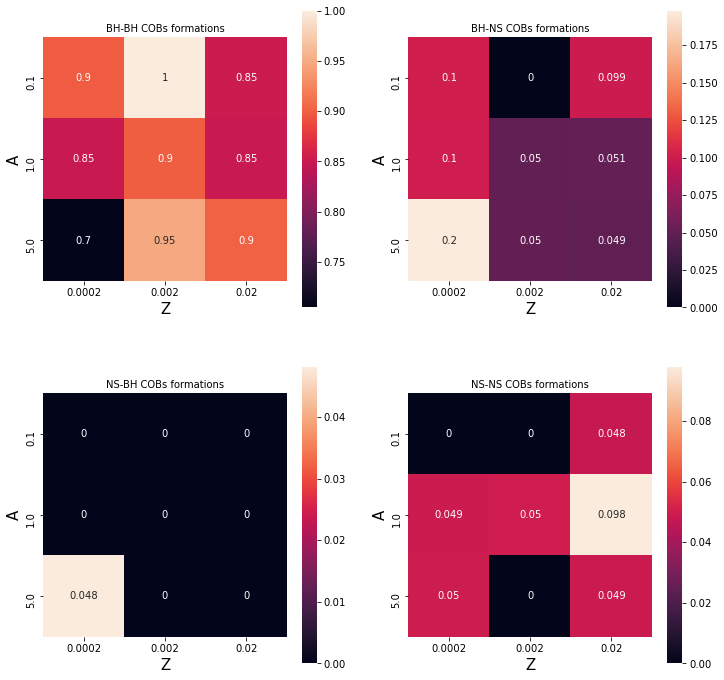

In [15]:
import seaborn as sns

def ct(x):
    df = x['ID'].count()
    return df

def p(x):
    df = x
    df[0] = df[0]/df[0].sum()
    return df

type_cobs = df_end_interest_nm.groupby(['A','Z','type']).apply(ct).reset_index().groupby(['A','Z']).apply(p)
type_cobs = type_cobs.groupby(['type','A','Z']).sum()[0]

type_cobs = type_cobs.reset_index()

Z = [0.0002, 0.002, 0.02] #Metallicity
A = [0.1, 1, 5] #alpha common envelope


f = ['BH-', 'NS-']
l = ['BH','NS']

for k in range(2):
    for a in range(2):
        
        typ = f[a]+l[k]
        for i in range(3):
            for j in range(3):
                try:
                    print(type_cobs[typ][A[i]][Z[j]])
                except:
                    type_cobs = type_cobs.append(pd.DataFrame({'type': typ, 'A':[A[i]], 'Z':[Z[j]], 0:[0]}, index = [int(100000*A[i]) + int(1000*Z[j])]))
                    
                    
type_cobs = type_cobs.groupby(['type','A','Z'])[0].sum()

import matplotlib.pyplot as plt

fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (12,12))
lss = ['-', '--', '-.']

Z = [0.0002, 0.002, 0.02] #Metallicity
A = [0.1, 1, 5] #alpha common envelope

f = ['BH-', 'NS-']
l = ['BH','NS']
for j in range(2):
    for i in range(2):
        
        typ = f[i]+l[j]
        

        piv = pd.pivot_table(type_cobs[typ].reset_index(), values = 0, index = ['A'], columns = ['Z'], fill_value = 0)

        
        ax[i, j].set_title(typ + ' COBs formations', fontsize = 10)    
        ax[i, j].set_xlabel('Z', fontsize = 15)
        ax[i, j].set_ylabel('A', fontsize = 15)
        ax[i, j].tick_params(axis = 'both', labelsize = 10)
        sns.heatmap(piv,square=True, annot = True, ax = ax[i, j])



# Mass, semi-major axis and eccentricity

For the BH-BH case, which is the most populated one, we plotted the mean values for the mass, semi-major axis and eccentricity both at the beginning and at the end of the simulation.

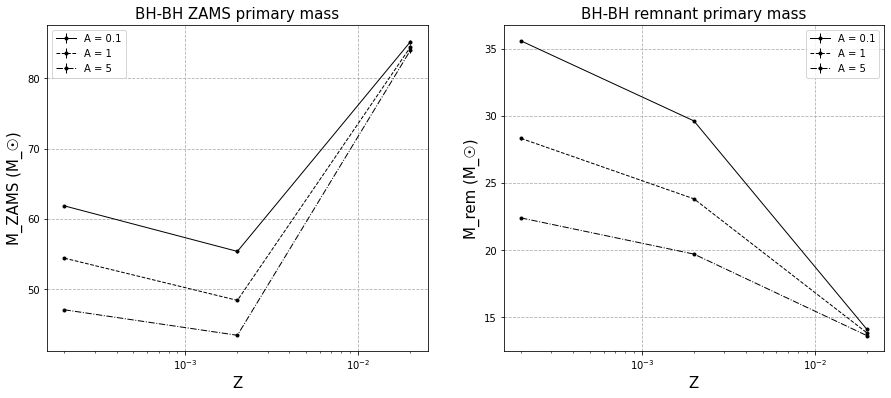

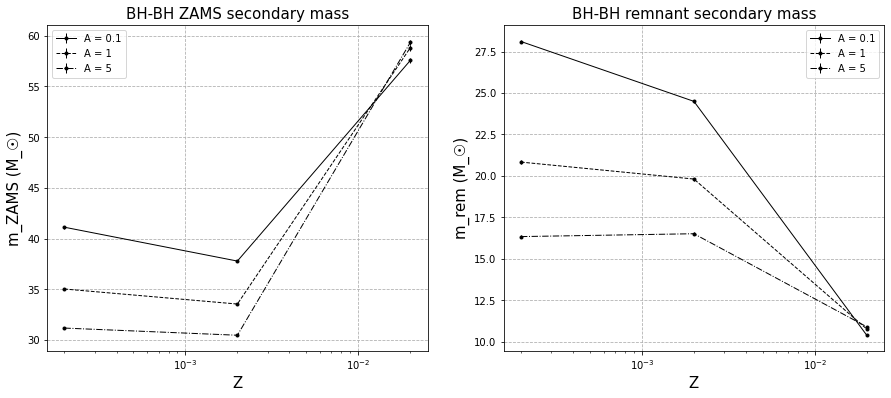

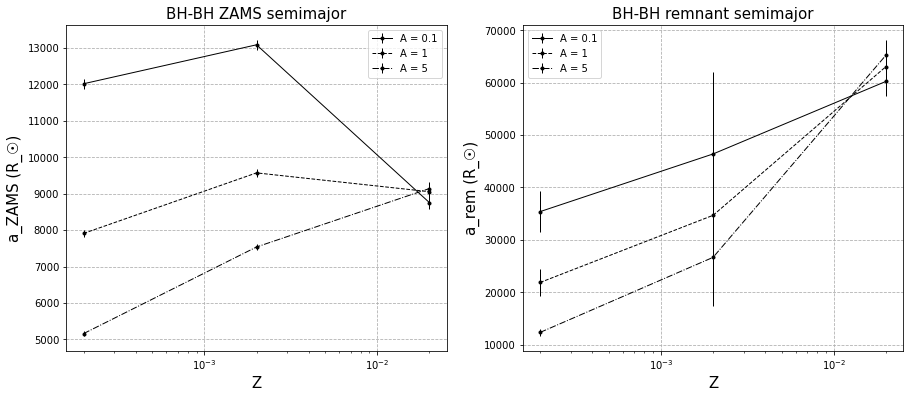

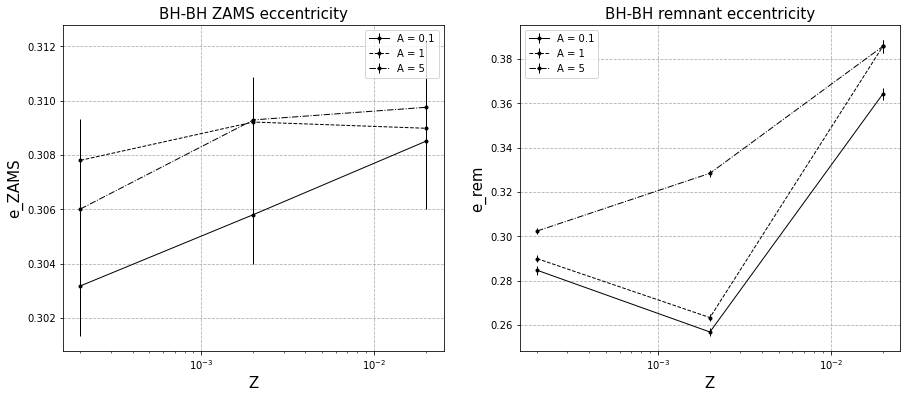

In [16]:
#type of binary system
typ = 'BH-BH'

#data at the end and at the beginning
bhbh_end = df_end_interest_nm[df_end_interest_nm['type'] == typ]
bhbh_start = df_start_interest_nm[df_start_interest_nm['type'] == typ]

M_cobs = bhbh_end.groupby(['A','Z'])['Mass_0'].mean()
M_cobs_std = bhbh_end.groupby(['A','Z'])['Mass_0'].std()/np.sqrt(bhbh_end.groupby(['A','Z'])['ID'].count())

M_cobs_st = bhbh_start.groupby(['A','Z'])['Mass_0'].mean()
M_cobs_std_st = bhbh_start.groupby(['A','Z'])['Mass_0'].std()/np.sqrt(bhbh_start.groupby(['A','Z'])['ID'].count())

m_cobs = bhbh_end.groupby(['A','Z'])['Mass_1'].mean()
m_cobs_std = bhbh_end.groupby(['A','Z'])['Mass_1'].std()/np.sqrt(bhbh_end.groupby(['A','Z'])['ID'].count())

m_cobs_st = bhbh_start.groupby(['A','Z'])['Mass_1'].mean()
m_cobs_std_st = bhbh_start.groupby(['A','Z'])['Mass_1'].std()/np.sqrt(bhbh_start.groupby(['A','Z'])['ID'].count())

a_cobs = bhbh_end.groupby(['A','Z'])['Semimajor'].mean()
a_cobs_std = bhbh_end.groupby(['A','Z'])['Semimajor'].std()/np.sqrt(bhbh_end.groupby(['A','Z'])['ID'].count())

a_cobs_st = bhbh_start.groupby(['A','Z'])['a'].mean()
a_cobs_std_st = bhbh_start.groupby(['A','Z'])['a'].std()/np.sqrt(bhbh_start.groupby(['A','Z'])['ID'].count())

e_cobs = bhbh_end.groupby(['A','Z'])['Eccentricity'].mean()
e_cobs_std = bhbh_end.groupby(['A','Z'])['Eccentricity'].std()/np.sqrt(bhbh_end.groupby(['A','Z'])['ID'].count())

e_cobs_st = bhbh_start.groupby(['A','Z'])['e'].mean()
e_cobs_std_st = bhbh_start.groupby(['A','Z'])['e'].std()/np.sqrt(bhbh_start.groupby(['A','Z'])['ID'].count())

import matplotlib.pyplot as plt

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15,6))
lss = ['-', '--', '-.']

Z = [0.0002, 0.002, 0.02] #Metallicity
A = [0.1, 1, 5] #alpha common envelope

for i in range(3):
    try:
        x = M_cobs.loc[A[i]].index.values
        y = M_cobs.loc[A[i]].values
        yerr = M_cobs_std.loc[A[i]].values

        ax[1].set_title(typ + ' remnant primary mass', fontsize = 15)
        ax[1].errorbar(x, y, yerr, label='A = ' + str(A[i]), marker = '.', color = 'black', ls = lss[i], lw = 1);
        ax[1].set_xlabel('Z', fontsize = 15)
        ax[1].set_xscale('log') 
        ax[1].grid(linestyle = '--', clip_on = False)
        ax[1].tick_params(axis = 'both', labelsize = 10)
        ax[1].set_ylabel('M_rem (M_☉)', fontsize = 15)
        ax[1].legend(loc='best', fontsize = 10) 
    except:
        None

for i in range(3):
    try:
        x = M_cobs_st.loc[A[i]].index.values
        y = M_cobs_st.loc[A[i]].values
        yerr = M_cobs_std_st.loc[A[i]].values

        ax[0].set_title(typ + ' ZAMS primary mass', fontsize = 15)
        ax[0].errorbar(x, y, yerr, label='A = ' + str(A[i]), marker = '.', color = 'black', ls = lss[i], lw = 1);
        ax[0].set_xlabel('Z', fontsize = 15)
        ax[0].set_xscale('log') 
        ax[0].grid(linestyle = '--', clip_on = False)
        ax[0].tick_params(axis = 'both', labelsize = 10)
        ax[0].set_ylabel('M_ZAMS (M_☉)', fontsize = 15)
        ax[0].legend(loc='best', fontsize = 10) 
    except:
        None

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15,6))

for i in range(3):
    try:
        x = m_cobs.loc[A[i]].index.values
        y = m_cobs.loc[A[i]].values
        yerr = m_cobs_std.loc[A[i]].values

        ax[1].set_title(typ + ' remnant secondary mass', fontsize = 15)
        ax[1].errorbar(x, y, yerr, label='A = ' + str(A[i]), marker = '.', color = 'black', ls = lss[i], lw = 1);
        ax[1].set_xlabel('Z', fontsize = 15)
        ax[1].set_xscale('log') 
        ax[1].grid(linestyle = '--', clip_on = False)
        ax[1].tick_params(axis = 'both', labelsize = 10)
        ax[1].set_ylabel('m_rem (M_☉)', fontsize = 15)
        ax[1].legend(loc='best', fontsize = 10) 
    except:
        None

for i in range(3):
    try:
        x = m_cobs_st.loc[A[i]].index.values
        y = m_cobs_st.loc[A[i]].values
        yerr = m_cobs_std_st.loc[A[i]].values

        ax[0].set_title(typ + ' ZAMS secondary mass', fontsize = 15)
        ax[0].errorbar(x, y, yerr, label='A = ' + str(A[i]), marker = '.', color = 'black', ls = lss[i], lw = 1);
        ax[0].set_xlabel('Z', fontsize = 15)
        ax[0].set_xscale('log') 
        ax[0].grid(linestyle = '--', clip_on = False)
        ax[0].tick_params(axis = 'both', labelsize = 10)
        ax[0].set_ylabel('m_ZAMS (M_☉)', fontsize = 15)
        ax[0].legend(loc='best', fontsize = 10) 
    except:
        None

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15,6))

for i in range(3):
    try:
        x = a_cobs.loc[A[i]].index.values
        y = a_cobs.loc[A[i]].values
        yerr = a_cobs_std.loc[A[i]].values

        ax[1].set_title(typ + ' remnant semimajor', fontsize = 15)
        ax[1].errorbar(x, y, yerr, label='A = ' + str(A[i]), marker = '.', color = 'black', ls = lss[i], lw = 1);
        ax[1].set_xlabel('Z', fontsize = 15)
        ax[1].set_xscale('log') 
        ax[1].grid(linestyle = '--', clip_on = False)
        ax[1].tick_params(axis = 'both', labelsize = 10)
        ax[1].set_ylabel('a_rem (R_☉)', fontsize = 15)
        ax[1].legend(loc='best', fontsize = 10) 
    except:
        None

for i in range(3):
    try:
        x = a_cobs_st.loc[A[i]].index.values
        y = a_cobs_st.loc[A[i]].values
        yerr = a_cobs_std_st.loc[A[i]].values

        ax[0].set_title(typ + ' ZAMS semimajor', fontsize = 15)
        ax[0].errorbar(x, y, yerr, label='A = ' + str(A[i]), marker = '.', color = 'black', ls = lss[i], lw = 1);
        ax[0].set_xlabel('Z', fontsize = 15)
        ax[0].set_xscale('log') 
        ax[0].grid(linestyle = '--', clip_on = False)
        ax[0].tick_params(axis = 'both', labelsize = 10)
        ax[0].set_ylabel('a_ZAMS (R_☉)', fontsize = 15)
        ax[0].legend(loc='best', fontsize = 10) 
    except:
        None

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (15,6))

for i in range(3):

    try:
        x = e_cobs.loc[A[i]].index.values
        y = e_cobs.loc[A[i]].values
        yerr = e_cobs_std.loc[A[i]].values

        ax[1].set_title(typ + ' remnant eccentricity', fontsize = 15)
        ax[1].errorbar(x, y, yerr, label='A = ' + str(A[i]), marker = '.', color = 'black', ls = lss[i], lw = 1);
        ax[1].set_xlabel('Z', fontsize = 15)
        ax[1].set_xscale('log') 
        ax[1].grid(linestyle = '--', clip_on = False)
        ax[1].tick_params(axis = 'both', labelsize = 10)
        ax[1].set_ylabel('e_rem', fontsize = 15)
        ax[1].legend(loc='best', fontsize = 10) 
    except:
        None

for i in range(3):

    try:
        x = e_cobs_st.loc[A[i]].index.values
        y = e_cobs_st.loc[A[i]].values
        yerr = e_cobs_std_st.loc[A[i]].values

        ax[0].set_title(typ + ' ZAMS eccentricity', fontsize = 15)
        ax[0].errorbar(x, y, yerr, label='A = ' + str(A[i]), marker = '.', color = 'black', ls = lss[i], lw = 1);
        ax[0].set_xlabel('Z', fontsize = 15)
        ax[0].set_xscale('log') 
        ax[0].grid(linestyle = '--', clip_on = False)
        ax[0].tick_params(axis = 'both', labelsize = 10)
        ax[0].set_ylabel('e_ZAMS', fontsize = 15)
        ax[0].legend(loc='best', fontsize = 10) 
    except:
        None

# Merge time computation via numerical integration of Peters equations

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
from numba import njit 
from scipy.integrate import solve_ivp
import astropy.constants as const 
from tqdm import tqdm

## Introduction
The main purpose of this work is to investigate how the metallicity $Z$ and the $\alpha_{\text{CE}}$ common envelope parameters influence whether or not a merge occurs; in order to do so we first need to be able to tell which binaries in our dataset will end up merging at all.                     
This task is trivial, at least in principle: if we could estimate the merge time through a function of the initial conditions then we would simply need to compare it with the age of the universe (approx. 14 b. years), with the idea that 
\begin{equation}
  \text{merge time} < \text{age of the universe} \implies \text{merge}
\end{equation}
and vice versa. Indeed we are effectively stating that having a merge time larger than the age of the universe means that no merge can occur in finite time.                           
This point implies that we need some function or algorithm capable of reliably computing $t_{\text{merge}}$. If only an approximate estimate is needed then it suffices to use the equation provided in [Peters 1964](https://journals.aps.org/pr/abstract/10.1103/PhysRev.136.B1224):
\begin{equation}
  t_{\text{merge}} = \frac{5c^5}{256G^3}\frac{a_0^4 (1-e_0^2)^{7/2}}{m_1 m_2 (m_1+m_2)}
\end{equation}
where $m_1, m_2, a_0, e_0$ are the binary's starting masses, semimajor axis and eccentricity respectively. Notice that an approximate estimate computed using this kind of equations can already be found in the SEVN dataset by summing the `BWorldtime` and the `GWtime` variables.                         
If more accurate results are needed one has to perform a numerical integration of the full [Peters 1964](https://journals.aps.org/pr/abstract/10.1103/PhysRev.136.B1224) dynamical equations for the semimajor axis/eccentricity pair:
\begin{equation}
  \frac{\mathrm{d}a}{\mathrm{d}t} = -\frac{64G^3}{5c^5}\frac{m_1 m_2 (m_1 + m_2)}{a^3(1-e^2)^{7/2}} \left(1 + \frac{73}{24}e^2 + \frac{37}{96}e^4 \right) \\
  \frac{\mathrm{d}e}{\mathrm{d}t} = -\frac{304G^3}{15c^5}e\frac{m_1 m_2 (m_1 + m_2)}{a^4 (1-e^2)^{5/2}} \left(1 + \frac{121}{304}e^2 \right) 
\end{equation}
These equations can be solved in a number of ways; which guarantees the best compromise between performance and accuracy is not trivial. For this reason in the first part of this section we will compare 5 different solvers using a limited fraction of our dataset; then when a winner is decided we apply it to the whole dataset, therefore computing our best estimate of $t_{\text{merge}}$.

## Mathematical details: numerical instability
The innocent-looking system of equations displayed above can actually be very tricky to manage depending on whether or not the chosen initial conditions will lead to a merger or not; why this is true is easily seen just by looking at the equations themselves.               
Indeed imagine we start with very large values of $a$ and $e$; then the denominators in both equations' RHS's will be huge (thanks to the $>1$ powers), hence the derivatives will be practically 0 - which means $a$ and $e$ will stay constant. This makes sense physically: when two objects are far away from each other GR approximates to classical physics, and in the familiar newtonian setting we know gravity is so weak it's negligible at large distances.                
Similarly if our two objects are initially very close then the denominators can be small; this makes the derivatives large in absolute value, but since they're negative $a$ and $e$ decrease - which only makes the derivatives even larger. This is a positive feedback loop which turns into an approximately exponential growth, which will cause $a$ to plummet to 0 making both derivatives basically infinite. Once again this makes sense: heavy objects when close cause extreme spacetime curvatures (exactly what we need for a nice GW emission).                
These two scenarios make the task of designing a numerical solver somewhat harder than usual; depending on the initial condition our solution will either be almost constant forever or only for a certain time, after which il will decrease so rapidly as to cause convergence issues/failures (which aren't the computer's fault in so far as physics itself is forcing the solution to break down).               
To visualize what has just been explained consider the two following examples (computed with the same techniques employed much below in the notebook):

In [2]:
#%run "produce_examples.py" # uncomment to produce the files needed below if they're missing

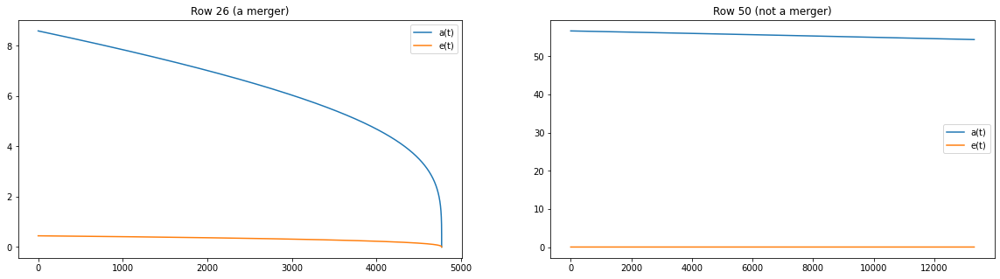

In [3]:
ex_merge = pd.read_csv('ex_merge_26.csv')
ex_no_merge = pd.read_csv('ex_no_merge_50.csv')

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 5))
ax[0].plot(ex_merge.t, ex_merge.a, label = 'a(t)')
ax[0].plot(ex_merge.t, ex_merge.e, label = 'e(t)')
ax[0].legend(loc = 'best')
ax[0].set_title('Row 26 (a merger)')
ax[1].plot(ex_no_merge.t, ex_no_merge.a, label = 'a(t)')
ax[1].plot(ex_no_merge.t, ex_no_merge.e, label = 'e(t)')
ax[1].legend(loc = 'best')
ax[1].set_title('Row 50 (not a merger)');

In [4]:
# %load produce_examples.py
# uncomment this cell magic to see what the script does, or simply open it separately

This means that we need to design a solver capable of dynamically adapting to both cases, since we don't know in the beginning whether we'll have a merger or not (we could peek at the `GWtime` column, but that would be cheating since we're trying to compute $t_{merge}$ independently).              
The challenge is that when our solution isn't changing a lot a large time step is adequate to speed up convergence (a "boring" behaviour is best skipped), whereas with rapidly changing solutions we need a small timestep in order to keep everything under control (otherwise the final solution will be wrong/fail to converge/etc.). There are two routes to achieve this dynamic timestep behaviour:
- we can either use `scipy`'s LSODA stiff solver/Julia's `DifferentialEquations.jl` library, or 
- we can design a custom solver whose timestep changes in response to how quickly/slowly the solution is currently changing.    
        
In the first part of this notebook we compare these methods and evaluate them according to performance, accuracy and ease of implementation.

## A note about units
The two universal constants appearing in our system of equations are $G$ and $c$; the other variables are the binary's masses, semimajor axis and eccentricity. Notice that by default SEVN data expresses binary-dependent quantities in non-standard units common in astrophysics: lengths are measured in solar radii, masses in solar masses and times in millions of years. This choice makes sense, since it allows us to control the order of magnitude of the involved quantities - and is also useful to avoid issues related to the limited precision of floating point arithmetic while solving for our potentially unstable solutions. For this reason we choose to preserve these non standard units - hence we need to convert $G$ and $c$, a task easily performed using `astropy`.           
Before proceeding any further let's compute these quantities; this is of course a prerequisite to defining the function that describes our system of equations.

In [5]:
print('SI G:')
print(const.G)
G = const.G.to('solRad^3/(solMass*Myr^2)')
print('Solar units G:', G)

print('\nSI c:')
print(const.c)
c = const.c.to('solRad/Myr')
print('Solar units c:', c)

SI G:
  Name   = Gravitational constant
  Value  = 6.6743e-11
  Uncertainty  = 1.5e-15
  Unit  = m3 / (kg s2)
  Reference = CODATA 2018
Solar units G: 3.925125598496094e+20 solRad3 / (Myr2 solMass)

SI c:
  Name   = Speed of light in vacuum
  Value  = 299792458.0
  Uncertainty  = 0.0
  Unit  = m / s
  Reference = CODATA 2018
Solar units c: 13598865132357.05 solRad / Myr


In [6]:
G, c = G.to_value(), c.to_value() # we remove the units to switch from an astropy object to a numpy one, otherwise numba will complain later

We will use these freshly computed `G` and `c` variables in every solver implementation, therefore we won't need to convert the data in the SEVN dataset.

## Custom solvers design
To design a custom algorithm capable of numerically solving Peters' equations it pays off to lay some preparations regarding notation; then we need to specify the details of how the algorithm actually works.
### Rewriting the equations
As a preparation for what follows we rewrite 
\begin{equation}
  \frac{\mathrm{d}a}{\mathrm{d}t} = -\frac{64G^3}{5c^5}\frac{m_1 m_2 (m_1 + m_2)}{a^3(1-e^2)^{7/2}} \left(1 + \frac{73}{24}e^2 + \frac{37}{96}e^4 \right) \\
  \frac{\mathrm{d}e}{\mathrm{d}t} = -\frac{304G^3}{15c^5}e\frac{m_1 m_2 (m_1 + m_2)}{a^4 (1-e^2)^{5/2}} \left(1 + \frac{121}{304}e^2 \right) 
\end{equation}
as 
\begin{equation}
  \frac{\mathrm{d}a}{\mathrm{d}t} = b_1\frac{1}{a^3(1-e^2)^{7/2}} \left(1 + b_2e^2 + b_3e^4 \right) \\
  \frac{\mathrm{d}e}{\mathrm{d}t} = d_1\frac{e}{a^4 (1-e^2)^{5/2}} \left(1 + d_2e^2 \right) 
\end{equation}
where $b_1 = b_0 m_1 m_2 (m_1+m_2)$, $b_0 = -64G^3/(5c^5)$, $b_2 = 73/24$, $b_3 = 37/96$; $d_1 = m_1 m_2 (m_1+m_2)$, $d_0 = -304G^3/(15c^5)$, $d_2 = 121/304$. This is simply a way to reduce visual clutter; this will make coding the solvers a bit easier.               
Notice that even though most of them are true constants $b_1$ and $d_1$ depend on the two masses, hence they need to be recomputed for every binary pair.

### Stopping condition
Like every numerical solver the function defined below loops over time instants and computes the solution one step at a time, by obtaining $x_{i+1}$ as some function of $x_i$ and $t$. Since we do not know in advance how many loop iterations will be needed to reach convergence we need to define some stopping conditions, specifically tailored to our problem; once again this commonly occurs while performing a numerical analysis of differential equations.
#### Maximum number of iterations 
it's a good practice to stop the loop once a certain number of iterations has been reached, in order to prevent infinite loops. Of course in order to design a general solver one needs to implement some rules to declare whether convergence has been reached within that max. number of iterations; this is not needed in this case, since the following two stopping condition (when combined with the adaptive timestep technique) will turn out to be much more restrictive - so that in no circumstance a loop will run for more than $10^6$ iterations. Indeed notice that are implementing this stopping condition mostly as a fail-safe to be sure.
#### ISCO 
Peters' equations describe the dynamics of two objects orbiting around each other and getting closer in time. As discussed above sometimes they will get close enough to merge, whereas some others they won't - but in any case they will get closer, as $a$ cannot not decrease. How then can we declare that they are close enough to merge *in general*? To be able to do so is very important because on one hand it can let us be more efficient (if they merged there's no point in continuing with the loop), and on the other it ensures the solution is well-behaved (asymptotically $a\to 0$ with $\dot{a} \to - \infty$, so if we let the loop go indefinitely at some point the solution will become numerically unstable; fortunately this only happens *after* the ISCO condition is satisfied). The solution to this problem can be found in [Buonanno 1999](https://arxiv.org/abs/gr-qc/9811091), whose abstract clearly states:
> We map the general relativistic two-body problem onto that of a test particle moving in an effective external metric. This effective-one-body approach defines, in a non-perturbative manner, the late dynamical evolution of a coalescing binary system of compact objects. The transition from the adiabatic inspiral, driven by gravitational radiation damping, to an unstable plunge, induced by strong spacetime curvature, is predicted to occur for orbits more tightly bound than the innermost stable circular orbit in a Schwarzschild metric of mass $M = m_1 + m_2$.

This means that we can pretend $a(t)$ is the position of a fictitious point particle falling towards a Schwarzschild singularity of mass $M = m_1 + m_2$, and that once this particle reaches the $R_{\text{ISCO}}$ of this orbit then the merger has occurred. Our second stopping condition, therefore, is 
\begin{equation}
  a < \frac{6GM}{c^2} = 6G\frac{m_1 + m_2}{c^2}
\end{equation}
#### Hubble time
If the other two conditions don't stop the loop before $t$ reaches the age of the universe then this means that a merger cannot occur in finite time, hence there's no point in continuing the loop; stopping it when $t$ becomes too large is another way to increase efficiency.

### Adaptive timestep algorithm
As we already mentioned the heart of the issue with Peters' equations is that we need an algorithm capable of dynamically adapting to cases where $\dot{a} \approx 0$ as well as to cases when $\dot{a} \to -\infty$. This means we need an *adaptive time step*; indeed when $\dot{a} \approx 0$ we can afford to take larger time steps since the solution doesn't change much, whereas when $\dot{a}$ is large we need tiny steps to correctly compute a rapidly changing solution. This calls for the following approach:
- we set a given relative tolerance parameter $\text{tol}$;
- in any given loop iteration we compute the relative variation between the old and new values of the solution; if this number is larger than $\text{tol}$ we reduce the time step by a constant factor (e.g. 10), compute again the new values and repeat this $\Delta t$ reduction until this condition is satisfied. This is enough to ensure that solutions obtained in cases where a merger does occur are well behaved.
- If on the other hand the relative variation between the new and old computed points is very small (e.g. 10 times smaller than $\text{tol}$) then it means that the solution is almost constant in that time interval, hence we can speed up convergence by e.g. doubling $\Delta t$. This guarantees that we do not waste time with almost flat solutions, where no merger can occur.

### Euler, midpoint, Runge Kutta of order 4
The only missing piece is how we compute $a(t+\Delta t)$ given $a(t)$; this problem is common in numerical analysis, and there are a number of formulae with varying degrees of accuracy/efficiency.          
For the sake of brevity we only consider three of them: *Euler's method*, the *midpoint method* and a *4th order Runge Kutta method*.
#### Euler 
Euler's method is a first order method; it's the simplest integrator (hence quite fast), at the expense of accuracy - but only in some cases is this really a problem. This method can be seen as a first order Taylor expansion or as an approximation of the derivative with the incremental ratio; in any case one obtains:
\begin{equation}
  x(t+\Delta t) = x(t) + \Delta t f(x(t), t) + O(\Delta t)
\end{equation}
where $f$ is $x$'s derivative, i.e. the RHS in the differential equation. By discretization we obtain:
\begin{equation}
  x_{n+1} \approx x_n + f(x_n, t_n)
\end{equation}
where $n$ represents the loop's n-th iteration.
#### Midpoint
This method can be seen as an improvement of Euler's method, where one evaluates the derivative at an intermediate time. By using eq. 1 from [here](https://en.wikipedia.org/wiki/Midpoint_method) we write:
\begin{equation}
  x_{n+1} \approx x_n + \Delta t f\left(x_n + \frac{\Delta t}{2}f(x_n, t_n), t_n + \frac{\Delta t}{2} \right)
\end{equation}
This method offers better accuracy (it's a second order approach) at the expense of a slightly worse efficiency, given the more complicated function evaluations.

#### RK4
This method is both quite a bit more accurate than Euler's (4th order) but also much more complex (hence potentially quite slower). It consists of multiple $f$ evaluations to compute 4 coefficients, a linear combination of which returns the new value:
\begin{equation}
  \begin{array} 
    \ c_1 = f(x_n, t_n) \\
    \ c_2 = f\left(x_n + \frac{1}{2}c_1, t_n + \frac{1}{2}\Delta t \right) \\
    \ c_3 = f\left(x_n + \frac{1}{2}c_2, t_n + \frac{1}{2}\Delta t \right) \\
    \ c_4 = f(x_n+c_3\Delta t, t_n+\Delta t) \\
    \ x_{n+1} \approx x_n + \frac{1}{6} (c_1+2c_2+2c_3+c_4)\Delta t 
  \end{array}
\end{equation}

### Recap
We now write out explicitly the pseudocode which wraps everything up.
- if `n. of current iterations` is $\geq$ `max_iters`, the relative difference of `current a` and `a_isco` is less than `tol` or if `current t` exceeds `Hubble time` stop the loop; otherwise continue.
- compute the proposed values for `a_new` and `e_new`; if the relative difference between `a_old` and `a_new` is larger than `tol` divide `current dt` by 10 and recompute `a_new` and `e_new` until this relative difference becomes smaller than `tol`. If instead the relative difference between `a_old` and `a_new` is smaller than `tol/10` multiply `current dt` by 2, then recompute `a_new` and `e_new`.
- set the old values equal to the new ones and increment `current t` by `current dt`, then proceed with the next iteration.

## Prebuilt solvers
We now consider how to solve our problem using pre-made functions/libraries. Notice that the most common routines cannot be applied to Peters' equations, as they lack the flexibility needed to automatically switch between a "slow" and a "fast" regime. Therefore we consider some less known, but quite powerful nonetheless tools.

### scipy's LSODA solver 
If we wanted to avoid the task of designing a custom algorithm a simple approach would be to use scipy's `solve_ivp` function with the `method = "LSODA"` argument. LSODA is a solver with automatic stiffness detection, capable of dynamically adapting its timestep size - which is what we need. This function, however, has a couple of issue which prevent it from being the optimal problem solution:
- LSODA (being a wrapper to old fortran code) isn't easily adapted to our specific problem, hence it "breaks easily"; indeed it often happens that towards the end of the integration some correct values are mixed with clearly wrong values (e.g. `NaN`s or negative $a$'s), hence we need to filter the final solution by removing these wrong numbers.
- Another issue is that this function cannot easily be sped up: due to technical limitations it's currently impossible to JIT compile scipy functions using numba, and similarly we cannot parallelize LSODA via dask.              

These two difficulties aren't bad enough to prevent us from actually using LSODA; even if just for testing we will then use it, since it allows us to compare a "professional" program with our hand made algorithms.

### Julia
If we're willing to abandon the familiar python language we can turn to Julia's `DifferentialEquations.jl` library, which is currently the most advanced, complete and performant existing software for the task of numerical integration of differential equations. This library easily allows us to obtain very customized and performant solvers (we can for example mix multiple algorithm adding automatic stiffness detection, parallelization over multiple initial conditions, custom continuous/discrete callbacks to stop the integration, etc.). This is a great alternative way of checking how our custom algorithm stacks against a "professional" solution; check the companion Julia notebook to see how we compute our solutions using this library.

## Custom solvers implementation
We now start defining the functions associated to the operations described above. Notice that in every case we use `GWtime`/10 as our initial `dt`, as `GWtime` itself is supposed to be a good order of magnitude estimate of the duration of the whole process.

In [7]:
# numba doesn't like global variables, so we pass the constants as arguments, too. Notice that since some of them depend on the masses they need to be computed for every row of the dataframe, so it's useful to create the following function
@njit 
def obtain_constants(row) : # numba supports numpy array but not pandas series, so when we apply these jitted functions to the dataframe we'll pass the rows as arrays instead of series --> we index via integers, not strings
    a = row[16] # row["Semimajor"]
    e = row[17] # row["Eccentricity"]
    M = row[2] # row["Mass_0"]
    m = row[9] # row["Mass_1"]

    t0 = row[18] # row["BWorldtime"]
    dt = row[20] # row["GWtime"]
    dt /= 10 # Since GWorldtime is only an order of magnitude estimate of the time needed after BWorldtime to obtain a merger (if one occurs at all) we best be careful and use e.g. a tenth of that as our initial dt

    b0 = -(64/5)*G**3/c**5
    b1 = b0*M*m*(M+m)
    b2 = 73/24 # writing the result of this operation would save us the time needed to perform this division every time instead of just once, but since this time is negligible we'd rather have visual clarity
    b3 = 37/96

    d0 = -(304/15)*G**3/c**5
    d1 = d0*M*m*(M+m)
    d2 = 121/304

    return a, e, t0, dt, b1, b2, b3, d1, d2

In [8]:
# let's now fix the algorithm's hyperparameters
max_iters = int(1e6) # <= 1 million iterations
tol = 1e-2 # 1% accuracy
tol10 = tol/10 # useful for speeding up"boring" solutions

@njit
def f(x, b1, b2, b3, d1, d2) : # RHS f Peters' equations in vector form
    y = np.zeros(2)
    y[0] = b1*(1+b2*x[1]**2+b3*x[1]**4)/((x[0]**3)*((1-x[1]**2)**3.5))
    y[1] = d1*x[1]*(1+d2*x[1]**2)/((x[0]**4)*((1-x[1]**2)**2.5))

    return y

# We first show the midpoint solver with some comments, then the bare implementations of Euler and RK

@njit
def midpoint(x0, x1, dfdt, dt, b1, b2, b3, d1, d2) : # midpoint update rule
    x = np.array([x0, x1])
    return x + dt*dfdt(x+0.5*dt*dfdt(x, b1, b2, b3, d1, d2), b1, b2, b3, d1, d2)

@njit
def mid(row) : # adaptive stepsize integrator with midpoint update rule
    a_end = 6*G*(row[2] + row[9])/c**2 # ISCO for our effective Schwarzschild geometry, signalling that the merger has occurred
    atol = a_end*tol 
    atol10 = atol/10
    a, e, t, dt, b1, b2, b3, d1, d2 = obtain_constants(row) # needed constants + initial conditions
    for i in range(max_iters) : # this loop + if and break is more efficient than a single, complex while
        if np.abs(a - a_end) < atol or t > 13.8e3 : # if a reaches the effective ISCO up to the chosen relative tolerance or if we exceed Hubble time we stop
            break
        a_new, e_new = midpoint(a, e, f, dt, b1, b2, b3, d1, d2) # proposed new values

        if np.abs(a - a_new) < a_new*tol10 : # if the old & new values are within 1/10 of the chosen tol. i.e. the sol. is almost constant we double the step size to speed up convergence
            dt *= 2
            a_new, e_new = midpoint(a, e, f, dt, b1, b2, b3, d1, d2)

        while np.abs(a - a_new) > a_new*tol : # if the new and old values further apart than the chosen tolerance we reduce dt until this condition is satisfied
            dt /= 10
            a_new, e_new = midpoint(a, e, f, dt, b1, b2, b3, d1, d2)

        a, e = a_new, e_new # we confirm the proposed values
        t += dt # we increment t by dt
    row[-1] = t # once the loop ends we assign the final time to the last column, then return the resulting row
    return row

In [9]:
@njit # notice that custom functions called within a numba jitted function have to be numba jitted themselves
def euler(x0, x1, dfdt, dt, b1, b2, b3, d1, d2) : # Euler update rule
    x = np.array([x0, x1])
    return x + dt*dfdt(x, b1, b2, b3, d1, d2)

@njit
def eu(row) :
    a_end = 6*G*(row[2] + row[9])/c**2 # ISCO for our effective Schwarzschild geometry, signalling that the merger has occurred
    atol = a_end*tol 
    atol10 = atol/10
    a, e, t, dt, b1, b2, b3, d1, d2 = obtain_constants(row)
    for i in range(max_iters) :
        if (np.abs(a - a_end) < atol) or (t > 13.8e3) :
            break
        a_new, e_new = euler(a, e, f, dt, b1, b2, b3, d1, d2)

        if np.abs(a - a_new) < a_new*tol10 :
            dt *= 2
            a_new, e_new = euler(a, e, f, dt, b1, b2, b3, d1, d2)

        while(np.abs(a - a_new) > a_new*tol) :
            dt /= 10
            a_new, e_new = euler(a, e, f, dt, b1, b2, b3, d1, d2)

        a, e = a_new, e_new
        t += dt
    row[-1] = t
    return row

In [10]:
@njit
def rk4(x0, x1, dfdt, dt, b1, b2, b3, d1, d2) : # Runge Kutta 4th order update rule
    x = np.array([x0, x1])
    c1 = dfdt( x, b1, b2, b3, d1, d2)
    c2 = dfdt(x+0.5*c1, b1, b2, b3, d1, d2)
    c3 = dfdt(x+0.5*c2, b1, b2, b3, d1, d2)
    c4 = dfdt(x+dt*c3, b1, b2, b3, d1, d2)

    return x + dt*(c1+2*c2+2*c3+c4)/6


@njit
def rk(row) :
    a_end = 6*G*(row[2] + row[9])/c**2 # ISCO for our effective Schwarzschild geometry, signalling that the merger has occurred
    atol = a_end*tol 
    atol10 = atol/10
    a, e, t, dt, b1, b2, b3, d1, d2 = obtain_constants(row)
    for i in range(max_iters) :
        if (np.abs(a - a_end) < atol) or (t > 13.8e3) :
            break
        a_new, e_new = rk4(a, e, f, dt, b1, b2, b3, d1, d2)

        if np.abs(a - a_new) < a_new*tol10 :
            dt *= 2
            a_new, e_new = rk4(a, e, f, dt, b1, b2, b3, d1, d2)

        while(np.abs(a - a_new) > a_new*tol) :
            dt /= 10
            a_new, e_new = rk4(a, e, f, dt, b1, b2, b3, d1, d2)

        a, e = a_new, e_new
        t += dt
    row[-1] = t
    return row

In [11]:
# We import the relevant data
df0 = pd.read_csv('df_output.csv').astype({'ID': int, 'Phase_0': int, 'Phase_1': int, 'RemnantType_0': int, 'RemnantType_1': int})
df0

,ID,name,Mass_0,Luminosity_0,Radius_0,Temperature_0,Phase_0,RemnantType_0,Zams_0,Mass_1,...,Phase_1,RemnantType_1,Zams_1,Semimajor,Eccentricity,BWorldtime,BTimestep,GWtime,Z,A
0,92,623198111468628,43.898200,1.000000e-15,0.000186,75.23506,7,6,44.67820,26.748790,...,7,6,31.791800,8218.0870,0.933191,6.255643,2.000000e-10,6.382552e+09,0.0002,0.1
1,112,586465437076249,23.048440,1.000000e-15,0.000098,103.90500,7,6,26.01399,27.232310,...,7,6,30.988940,134.8864,0.009944,4.975206,2.000000e-10,1.572015e+06,0.0002,0.1
2,124,214297123674238,36.259980,1.000000e-15,0.000154,82.86009,7,6,43.63717,32.662180,...,7,6,37.747990,481.9433,0.012562,4.733170,2.000000e-10,9.903180e+07,0.0002,0.1
3,154,559548692536031,38.306070,1.000000e-15,0.000163,80.53965,7,6,86.13720,56.341010,...,7,6,57.456900,80356.4100,0.095792,4.171837,2.000000e-10,2.963007e+16,0.0002,0.1
4,180,424791614019654,17.229310,1.000000e-15,0.000073,120.21590,7,6,19.27244,17.397330,...,7,6,19.519880,109.5645,0.014440,6.984805,2.000000e-10,2.080002e+06,0.0002,0.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230045,899694,430764938470682,8.034107,1.000000e-15,0.000034,176.19630,7,6,17.49480,6.209679,...,7,6,15.720420,2286.6000,0.247431,5.506292,2.000000e-10,4.623389e+12,0.0200,5.0
230046,899795,931971495385373,15.378850,1.000000e-15,0.000065,127.11050,7,6,100.42560,15.113400,...,7,6,96.932100,10003.8200,0.132846,3.315733,2.000000e-10,1.990603e+14,0.0200,5.0
230047,899879,158937381720381,14.039520,1.000000e-15,0.000060,133.04060,7,6,81.94600,1.235519,...,7,5,3.711674,433.0090,0.511304,13.406500,2.000000e-10,6.887031e+09,0.0200,5.0
230048,899888,161831677695017,4.364386,1.000000e-15,0.000019,238.61120,7,6,13.42219,1.235519,...,7,5,4.082497,349.3680,0.584510,12.611660,2.000000e-10,1.712514e+10,0.0200,5.0


In [12]:
# we don't need to test the different algorithms on the complete dataset, as this would be unnecessary and tedious; for this reason we consider a small fraction of the available rows
n_rows_to_keep = 2500 # we keep 2500 rows, so that at least for ~100 of them we will observe a merge
df = df0[:n_rows_to_keep].copy()

In [13]:
# our complete dataset is only about 40 MB and the reduced dataset is much smaller, so for testing purposes it's not a problem if we copy df multiple times
df_eu = df.copy()
df_mid = df.copy() 
df_rk = df.copy()

# each one of the following columns will be populated with a different update rule as defined above
df_eu["Merge_time_euler"] = np.nan
df_mid["Merge_time_midpoint"] = np.nan
df_rk["Merge_time_rk4"] = np.nan

In [14]:
%%time
df_eu = df_eu.apply(eu, axis = 1, raw = True) # axis = 1 is needed to apply this function to each row instead of each column
# raw = True passes each row to the function as a numpy array instead of a pandas series; as mentioned before this is needed to ensure numba compatibility

Wall time: 1.18 s


In [15]:
%%time
df_mid = df_mid.apply(mid, axis = 1, raw = True)

Wall time: 814 ms


In [16]:
%%time
df_rk = df_rk.apply(rk, axis = 1, raw = True)

Wall time: 3min 6s


In [17]:
# Now let's define the function needed to compute the solution using the LSODA solver from scipy

T = 13.8e3 # Hubble time in Myr

@njit
def f_t(t, x, b1, b2, b3, d1, d2) : # This function is identical to f (RHS of Peters' equation), but with an extra first argument named t to ensure compatibility with scipy.integrate.solve_ivp
    y = np.zeros(2)
    y[0] = b1*(1+b2*x[1]**2+b3*x[1]**4)/((x[0]**3)*((1-x[1]**2)**3.5))
    y[1] = d1*x[1]*(1+d2*x[1]**2)/((x[0]**4)*((1-x[1]**2)**2.5))

    return y


def merge_time_lsoda(row) : # since this function is incompatible with numba we might as well use the more familiar pandas series
    a, e, t0, dt, b1, b2, b3, d1, d2 = obtain_constants(row.to_numpy())    
    # we integrate from t0 to Hubble time (after which the solution becomes meaningless physically)

    sol = solve_ivp(f_t, [t0,T], [a,e], method = "LSODA", args = (b1, b2, b3, d1, d2), min_step = 1e-11) # here using a min step is the key to make this work

    x = sol.y[0]

    row[-1] = sol.t[np.argmin(x[(~np.isnan(x)) & (x > 0)])]
    return row
    # of course if a merger occurs before T the solution breaks down, but since the scipy based solver lacks the flexibility to stop before the 
    # assigned upper integration bound (unlike Julia's solver, where we can define custom callback conditions) the "broken" final part of the solution vector has to be discarded. This is done simply
    # by choosing the smallest (i.e. occurring later) value of the solution which is still physically sensible (i.e. is not NaN and is positive)

In [18]:
%%time
df_lsoda = df.copy()
df_lsoda["Merge_time_lsoda"] = np.nan

df_lsoda = df_lsoda.apply(merge_time_lsoda, axis = 1)
df_lsoda

C:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\integrate\_ode.py:1350: UserWarning: lsoda: Repeated convergence failures (perhaps bad Jacobian or tolerances).
  warnings.warn('{:s}: {:s}'.format(self.__class__.__name__,
C:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\integrate\_ode.py:1350: UserWarning: lsoda: Repeated error test failures (internal error).
  warnings.warn('{:s}: {:s}'.format(self.__class__.__name__,
Wall time: 1.11 s


,ID,name,Mass_0,Luminosity_0,Radius_0,Temperature_0,Phase_0,RemnantType_0,Zams_0,Mass_1,...,RemnantType_1,Zams_1,Semimajor,Eccentricity,BWorldtime,BTimestep,GWtime,Z,A,Merge_time_lsoda
0,92.0,6.231981e+14,43.89820,1.000000e-15,0.000186,75.23506,7.0,6.0,44.67820,26.748790,...,6.0,31.79180,8218.087000,0.933191,6.255643,2.000000e-10,6.382552e+09,0.0002,0.1,13800.000000
1,112.0,5.864654e+14,23.04844,1.000000e-15,0.000098,103.90500,7.0,6.0,26.01399,27.232310,...,6.0,30.98894,134.886400,0.009944,4.975206,2.000000e-10,1.572015e+06,0.0002,0.1,13800.000000
2,124.0,2.142971e+14,36.25998,1.000000e-15,0.000154,82.86009,7.0,6.0,43.63717,32.662180,...,6.0,37.74799,481.943300,0.012562,4.733170,2.000000e-10,9.903180e+07,0.0002,0.1,13800.000000
3,154.0,5.595487e+14,38.30607,1.000000e-15,0.000163,80.53965,7.0,6.0,86.13720,56.341010,...,6.0,57.45690,80356.410000,0.095792,4.171837,2.000000e-10,2.963007e+16,0.0002,0.1,13800.000000
4,180.0,4.247916e+14,17.22931,1.000000e-15,0.000073,120.21590,7.0,6.0,19.27244,17.397330,...,6.0,19.51988,109.564500,0.014440,6.984805,2.000000e-10,2.080002e+06,0.0002,0.1,13800.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,307400.0,8.536542e+14,26.39870,1.000000e-15,0.000112,97.08277,7.0,6.0,30.06574,24.200570,...,6.0,27.41962,119.958500,0.009882,4.655624,2.000000e-10,9.600316e+05,0.0002,0.1,13800.000000
2496,307427.0,6.111058e+14,35.83278,1.000000e-15,0.000152,83.27723,7.0,6.0,42.86181,35.568870,...,6.0,42.43849,20.214680,0.054350,3.655644,2.000000e-10,2.722543e+02,0.0002,0.1,273.294777
2497,307455.0,9.300241e+14,37.94331,1.000000e-15,0.000161,80.93258,7.0,6.0,46.79656,7.321097,...,6.0,11.71306,20.846330,0.126676,7.137279,2.000000e-10,2.127762e+03,0.0002,0.1,2109.542604
2498,307474.0,3.766431e+14,38.95212,1.000000e-15,0.000165,79.88245,7.0,6.0,48.41524,21.209380,...,6.0,23.91973,4.569291,0.008311,5.641471,2.000000e-10,1.314544e+00,0.0002,0.1,6.943157


In [19]:
# finally we use Julia as our last method to compute the merge time. Check the companion notebook to see 
# how these values are computed (here we take a lazy approach, a smarter choice is to call julia code from python)

df[['Semimajor', 'Eccentricity', 'Mass_0', 'Mass_1', 'BWorldtime', 'GWtime']].to_csv('df_julia_input.csv', index = False) # export data to use in julia
julia_array = pd.read_csv('df_julia_output.csv')['data'].rename('Merge_time_julia') # get data from julia
julia_array

0       3.191276e+09
1       7.860075e+05
2       4.951590e+07
3       1.481504e+16
4       1.040001e+06
            ...     
2495    4.800158e+05
2496    1.361272e+02
2497    1.063881e+03
2498    6.572720e-01
2499    2.877000e+10
Name: Merge_time_julia, Length: 2500, dtype: float64

## Comparing the results
We now compare the results of the five solvers using a simple, qualitative technique; namely, we plot the absolute value differences between each solver's solution and e.g. the midpoint one - as this is the solver which we'll see is the best overall compromise.            
Notice that in this comparison we only consider binaries that merge in finite time, as a) anything larger than Hubble time is unphysical, and b) due to technical details some solvers stop right after reaching Hubble time, while others don't - so it wouldn't be a completely fair comparison.        
We also plot the `GWtime` column to see how good that approximation is.

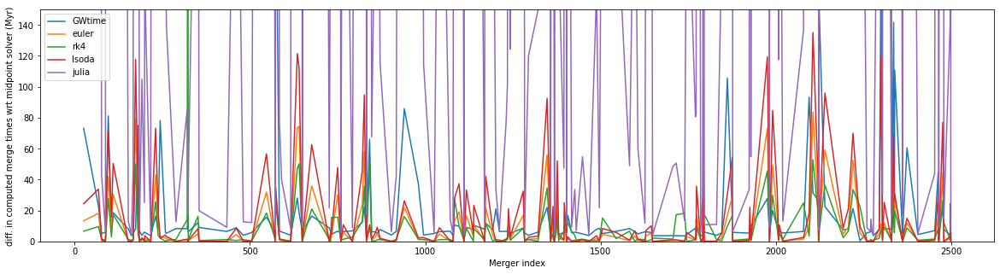

In [20]:
mask = df_mid['Merge_time_midpoint'] < 13.8e3
ref = df_mid.loc[mask, 'Merge_time_midpoint']

fig, ax = plt.subplots(figsize = (20, 5))

ax.plot((ref - df.loc[mask, 'GWtime']).abs(), label = 'GWtime')

df_list = [df_eu, df_rk, df_lsoda, pd.DataFrame(julia_array)]
str_list = ['euler', 'rk4', 'lsoda', 'julia']

for i, tmp in enumerate(df_list) :
    s = str_list[i]
    ax.plot((ref - tmp.loc[mask, 'Merge_time_' + s]).abs(), label = s)

ax.set_ylabel('diff. in computed merge times wrt midpoint solver (Myr)')
ax.set_xlabel('Merger index')
ax.set_ylim(0, 150)
ax.legend(loc = 'best'); 
# julia behaves in a strange way, explained below; for now let's remove it from the plot

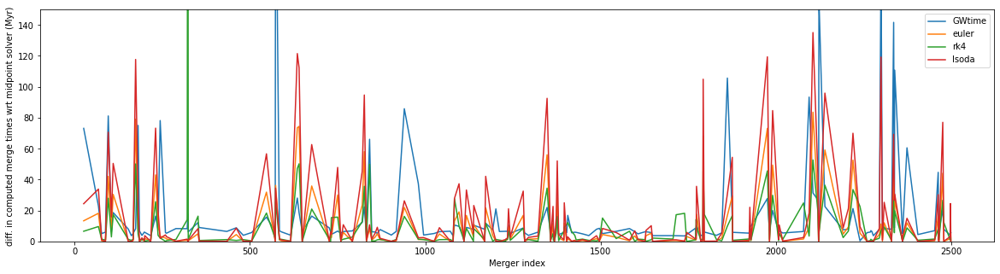

In [21]:
# version without julia
mask = df_mid['Merge_time_midpoint'] < 13.8e3
ref = df_mid.loc[mask, 'Merge_time_midpoint']

fig, ax = plt.subplots(figsize = (20, 5))

ax.plot((ref - df.loc[mask, 'GWtime']).abs(), label = 'GWtime')

df_list = [df_eu, df_rk, df_lsoda]
str_list = ['euler', 'rk4', 'lsoda']

for i, tmp in enumerate(df_list) :
    s = str_list[i]
    ax.plot((ref - tmp.loc[mask, 'Merge_time_' + s]).abs(), label = s)

ax.set_ylabel('diff. in computed merge times wrt midpoint solver (Myr)')
ax.set_xlabel('Merger index')
ax.set_ylim(0, 150)
ax.legend(loc = 'best');
# remember that ~100-200 Myr differences for most mergers isn't bad, because it's not much compared to 
# our reference scale of Hubble time - relevant because we mostly want to know whether a merger occurs or not

### A comment about Julia
Notice that Julia seems to have much larger differences in the above plot. This is a consequence of the fact that due to technical difficulties and lack of know-how we were not able to fully implement the isco stopping condition, relying instead on a callback which simply *conservatively* checked whether the solution was getting too close to zero. This implies that almost every time the solution will look somewhat different from the others; this doesn't mean that using Julia's DE library is bad, only that it works differently and that it's hard to satisfyingly use for this problem.

Many things can be inferred from the above plot, the most important of which is that every solver gives solutions which differ from each other by at most 100-200 Myr. This isn't much because what we mostly want to know is whether or not a binary will merge - and for that the relevant scale is the Hubble time, which is an order of magnitude more than this difference.                
We also notice that in most cases the `GWtime` column was a decent approximation of the "true" value for the merge time.                 
This lets us observe the following point: if every solver is more or less equivalent to the others as far as the quality of the solution is concerned then we must look for more practical criteria if we want to decide a winner; what we want to consider, then, is the compromise between accuracy and efficiency.  
Consider the following points:                    
- Notice that Euler, midpoint, LSODA and Julia all take ~1 s to finish computing wrt the smaller dataset (with midpoint actually being the fastest), whereas the Runge-Kutta solver is ~200 slower for no significant improvement in accuracy; for this we decide the RK4 solver is not the best one.                       
- Julia is hard to use in a satisfying way and awkward to use in conjuction with python (one either has to switch back and forth between notebooks or to call Julia code from python), so this one too isn't the best solver; this technique is probably best left to other problems.
- LSODA has solid performance but we need to "cheat" to make it work; this is fine most of the time, but when we run it on the whole dataset there are some rows where the result is wrong by many orders of magnitude - hence this method isn't 100% safe, so we discard this, too.
- Finally we observe that Euler and midpoint have very similar speeds, but since in theory midpoint is more accurate there's no point in picking Euler.                    
To recap: The fact that Euler, midpoint and LSODA are so close to each other gives us confidence that these are the best solvers as far as accuracy is concerned (other estimates jump around/are "shifted"/etc.); due to the above performance reasons it's probably best to choose the midpoint solver.

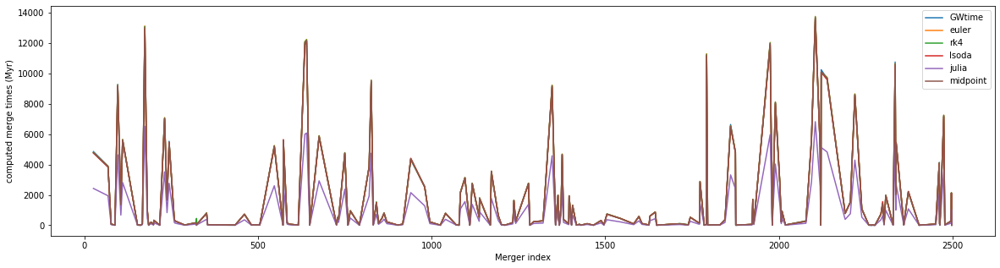

In [22]:
# a simple way to prove that these seemingly huge relative differences are actually small is 
# to plot the merge times themselves; in the grand scheme of things they appear to be 
# almost indistinguishable

fig, ax = plt.subplots(figsize = (20, 5))

ax.plot(df.loc[mask, 'GWtime'], label = 'GWtime')

df_list = [df_eu, df_rk, df_lsoda, pd.DataFrame(julia_array), df_mid]
str_list = ['euler', 'rk4', 'lsoda', 'julia', 'midpoint']

for i, tmp in enumerate(df_list) :
    s = str_list[i]
    ax.plot(tmp.loc[mask, 'Merge_time_' + s], label = s)

ax.set_ylabel('computed merge times (Myr)')
ax.set_xlabel('Merger index')
ax.legend(loc = 'best');

In [23]:
# since we chose midpoint we extend it to the whole dataset

df1 = df0.copy().astype({'ID': int, 'Phase_0': int, 'Phase_1': int, 'RemnantType_0': int, 'RemnantType_1': int})
df1['Merge_time_midpoint'] = np.nan

df1 = df1.apply(mid, axis = 1, raw = True)
df1

,ID,name,Mass_0,Luminosity_0,Radius_0,Temperature_0,Phase_0,RemnantType_0,Zams_0,Mass_1,...,RemnantType_1,Zams_1,Semimajor,Eccentricity,BWorldtime,BTimestep,GWtime,Z,A,Merge_time_midpoint
0,92.0,6.231981e+14,43.898200,1.000000e-15,0.000186,75.23506,7.0,6.0,44.67820,26.748790,...,6.0,31.791800,8218.0870,0.933191,6.255643,2.000000e-10,6.382552e+09,0.0002,0.1,6.382553e+07
1,112.0,5.864654e+14,23.048440,1.000000e-15,0.000098,103.90500,7.0,6.0,26.01399,27.232310,...,6.0,30.988940,134.8864,0.009944,4.975206,2.000000e-10,1.572015e+06,0.0002,0.1,1.572513e+04
2,124.0,2.142971e+14,36.259980,1.000000e-15,0.000154,82.86009,7.0,6.0,43.63717,32.662180,...,6.0,37.747990,481.9433,0.012562,4.733170,2.000000e-10,9.903180e+07,0.0002,0.1,9.903227e+05
3,154.0,5.595487e+14,38.306070,1.000000e-15,0.000163,80.53965,7.0,6.0,86.13720,56.341010,...,6.0,57.456900,80356.4100,0.095792,4.171837,2.000000e-10,2.963007e+16,0.0002,0.1,2.963007e+14
4,180.0,4.247916e+14,17.229310,1.000000e-15,0.000073,120.21590,7.0,6.0,19.27244,17.397330,...,6.0,19.519880,109.5645,0.014440,6.984805,2.000000e-10,2.080002e+06,0.0002,0.1,2.080700e+04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230045,899694.0,4.307649e+14,8.034107,1.000000e-15,0.000034,176.19630,7.0,6.0,17.49480,6.209679,...,6.0,15.720420,2286.6000,0.247431,5.506292,2.000000e-10,4.623389e+12,0.0200,5.0,4.623389e+10
230046,899795.0,9.319715e+14,15.378850,1.000000e-15,0.000065,127.11050,7.0,6.0,100.42560,15.113400,...,6.0,96.932100,10003.8200,0.132846,3.315733,2.000000e-10,1.990603e+14,0.0200,5.0,1.990603e+12
230047,899879.0,1.589374e+14,14.039520,1.000000e-15,0.000060,133.04060,7.0,6.0,81.94600,1.235519,...,5.0,3.711674,433.0090,0.511304,13.406500,2.000000e-10,6.887031e+09,0.0200,5.0,6.887032e+07
230048,899888.0,1.618317e+14,4.364386,1.000000e-15,0.000019,238.61120,7.0,6.0,13.42219,1.235519,...,5.0,4.082497,349.3680,0.584510,12.611660,2.000000e-10,1.712514e+10,0.0200,5.0,1.712514e+08


In [24]:
df1.to_csv('df1_mid.csv', index = False)

## Conclusions about the integration task
We discussed why it's not trivial to obtain the solution of Peters' equations when a merger occurs - which is the only possible not boring circumstance. We traced these issues to the stability problem, where due to physical reasons the solution sometimes suddenly accelerates by a lot; this difficulty was solved using adaptive timestep techniques.            
We compared three custom solvers (Euler, midpoint, RK4) and 2 ready-made ones (scipy's LSODA, Julia's DifferentialEquations.jl), then found that the midpoint rule provides the best compromise between accuracy and overall efficiency.

## Study on merging COBs

We first investigate for the different COBs types BH-BH, BH-NS, NS-BH, NS-NS (where the first is the primary stellar and the second the secondary stellar) when they merge and produce a detectable gravitational wave in a Hubble time.

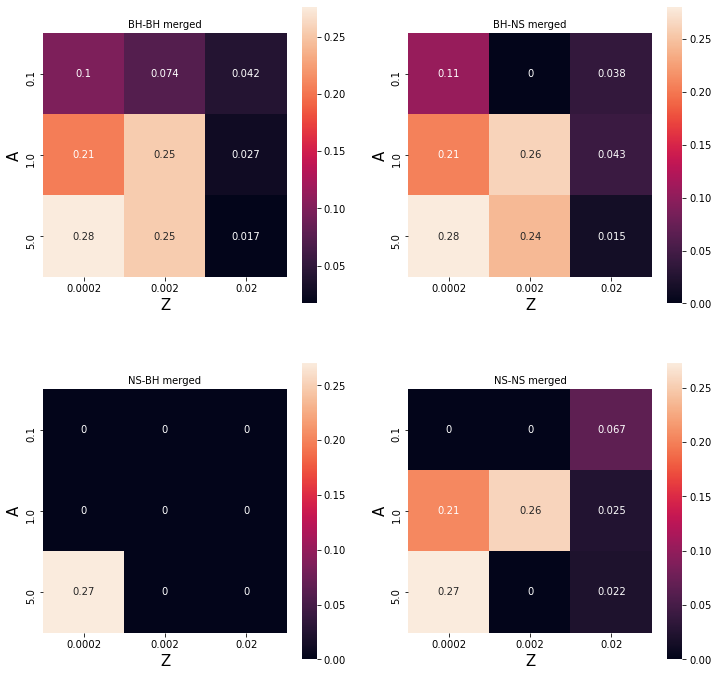

In [24]:
summ  = df_end_interest_nm.groupby(['type','A','Z']).apply(lambda x: x['Merge_time_midpoint']<= 14e3).reset_index().groupby(['type','A','Z'])['Merge_time_midpoint'].sum()
sumnm  = df_end_interest_nm.groupby(['type','A','Z'])['Merge_time_midpoint'].count()

merged = (summ/sumnm).reset_index()

Z = [0.0002, 0.002, 0.02] #Metallicity
A = [0.1, 1, 5] #alpha common envelope


f = ['BH-', 'NS-']
l = ['BH','NS']

for k in range(2):
    for a in range(2):
        
        typ = f[a]+l[k]
        for i in range(3):
            for j in range(3):
                try:
                    merged[typ][A[i]][Z[j]]
                except:
                    merged = merged.append(pd.DataFrame({'type': typ, 'A':[A[i]], 'Z':[Z[j]], 'Merge_time_midpoint':[0]}, index = [int(100000*A[i]) + int(1000*Z[j])]))
                    
merged = merged.groupby(['type','A','Z'])['Merge_time_midpoint'].sum()

import matplotlib.pyplot as plt

fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (12,12))
lss = ['-', '--', '-.']

Z = [0.0002, 0.002, 0.02] #Metallicity
A = [0.1, 1, 5] #alpha common envelope

f = ['BH-', 'NS-']
l = ['BH','NS']
for j in range(2):
    for i in range(2):
        
        typ = f[i]+l[j]
        

        piv = pd.pivot_table(merged[typ].reset_index(), values = 'Merge_time_midpoint', index = ['A'], columns = ['Z'], fill_value = 0)

        
        ax[i, j].set_title(typ + ' merged', fontsize = 10)    
        ax[i, j].set_xlabel('Z', fontsize = 15)
        ax[i, j].set_ylabel('A', fontsize = 15)
        ax[i, j].tick_params(axis = 'both', labelsize = 10)
        sns.heatmap(piv,square=True, annot = True, ax = ax[i, j])

We can  note that for hight metallicity the formation of gravitational waves is very uncommon and that it does not depend from the COBs type but only from the metallicity and the common envelope parameter. The most common gravitational waves are produced by COBs with Z = 0.0002 and A = 5 but the order of magnitude is the same for all the rest of the cobinations of the parameter. 

Note that where the fraction is 0 does not mean that those parameters does not produce GWs; simply means that there are no COBs for those combinations of parameters and so no gravitational waves can arise.

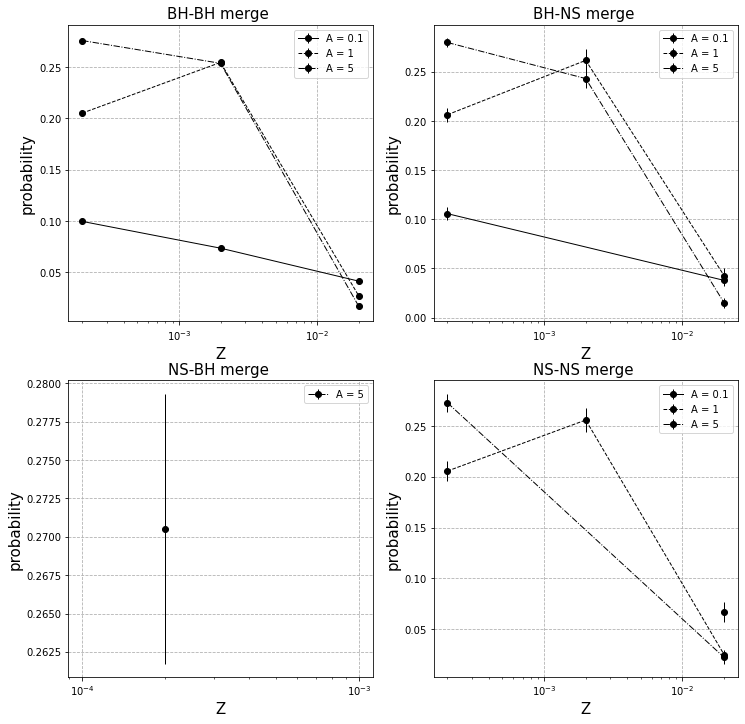

In [25]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (12,12))
lss = ['-', '--', '-.']

Z = [0.0002, 0.002, 0.02] #Metallicity
A = [0.1, 1, 5] #alpha common envelope

f = ['BH-', 'NS-']
l = ['BH','NS']
for j in range(2):
    for i in range(2):
        
        typ = f[i]+l[j]
        ax[i, j].set_title(typ + ' merge ', fontsize = 15)
        
        for a in range(3):
            try:
                x = merged[typ][A[a]].index.values
                y = merged[typ][A[a]].values
                x = x[y != 0]
                y = y[y != 0]
                n = df_end_interest_nm.groupby(['type','A','Z']).apply(lambda x: ct(x))[typ][A[a]].values
                ax[i, j].errorbar(x, y,np.sqrt(y*(1-y)/n), label='A = ' + str(A[a]), marker = 'o', color = 'black', ls = lss[a], lw = 1);
            except:
                None
            
        ax[i, j].set_xlabel('Z', fontsize = 15)
        ax[i, j].set_xscale('log') 
        ax[i, j].grid(linestyle = '--', clip_on = False)
        ax[i, j].tick_params(axis = 'both', labelsize = 10)
        ax[i, j].set_ylabel('probability', fontsize = 15)
        ax[i, j].legend(loc='best', fontsize = 10) 

This is a cartesian rappresentation of the previous plot where binomial errors are given to the points. From this we can see that despite the order of magnitude of the fraction of merging COBs is the same, for different parameters the variables are statistical indipendent except for A = 5 and A = 1 that seems they produce the same results for Z = 0.002.

## Primary Mass of the COBs

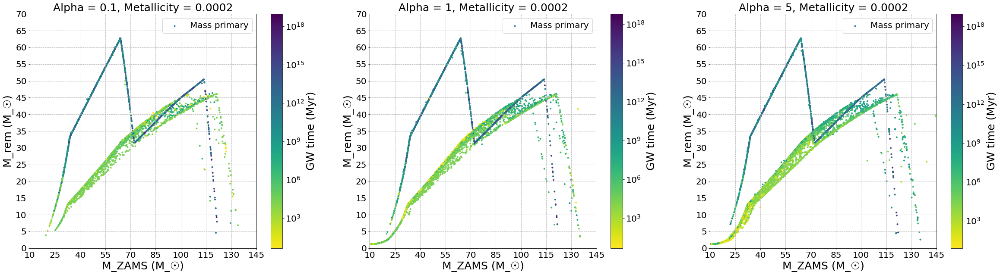

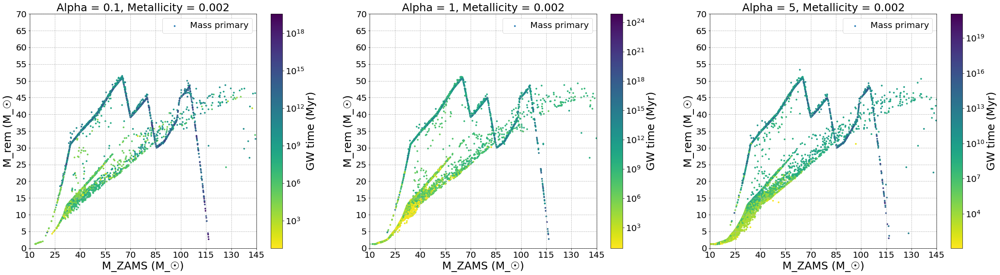

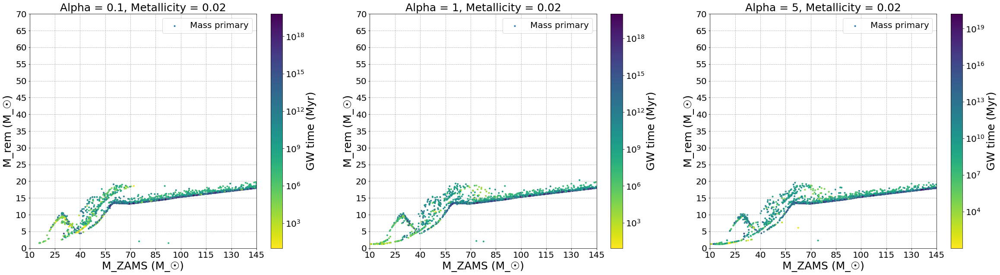

In [57]:
import matplotlib.pyplot as plt
import matplotlib 

Zs = [0.0002,0.002, 0.02] #Metallicity
As = [0.1, 1, 5] #alpha common envelope

#N = 2000


for z in Zs:
    i = 0
    
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (40,40/4))

    for a in As:
              
        
        df_output = df_end_interest_nm[df_end_interest_nm['Z'] == z]
        df_output = df_output[df_output['A'] == a]

        df_input = df_start_interest_nm[df_start_interest_nm['Z'] == z]
        df_input = df_input[df_input['A'] == a]
        
        
        df_input = df_input
        df_output = df_output
        
        df_output = df_output.sample(frac = 0.2, random_state = 6)
        df_input = df_input.sample(frac = 0.2, random_state = 6)
        

        ax[i].set_title('Alpha = ' +  str(a) + ', Metallicity = ' + str(z), fontsize = 25)
        s = ax[i].scatter(df_input.Mass_0, df_output.Mass_0,
                      label='Mass primary', marker = '.', alpha = 1,
                      c=df_output['Merge_time_midpoint'], cmap = 'viridis_r',
                      norm=matplotlib.colors.LogNorm(
                          vmin=df_output['Merge_time_midpoint'].min(), vmax=df_output['Merge_time_midpoint'].max()));
        
        ax[i].tick_params(axis = 'both', labelsize = 20)
        ax[i].set_xticks(np.arange(10,160,15))
        ax[i].set_yticks(np.arange(0,75,5))
        ax[i].grid(linestyle = '--', clip_on = False)
        ax[i].set_xlim(left=10,right=145)
        ax[i].set_ylim(bottom=0,top=70)
        ax[i].set_xlabel('M_ZAMS (M_☉)', fontsize = 25)
        ax[i].set_ylabel('M_rem (M_☉)', fontsize = 25)
        ax[i].legend(loc='best', fontsize = 20)  
        
        cbar = plt.colorbar(mappable = s, ax=ax[i])
        cbar.set_label('GW time (Myr)', fontsize = 25)
        cbar.ax.tick_params(labelsize=20)
        i += 1 
 

We can  see that the remnant vs ZAMS primary mass does not depends from Alpha but only from the metallicity and as we expect for hight metallicity there is a bigger loss mass. 

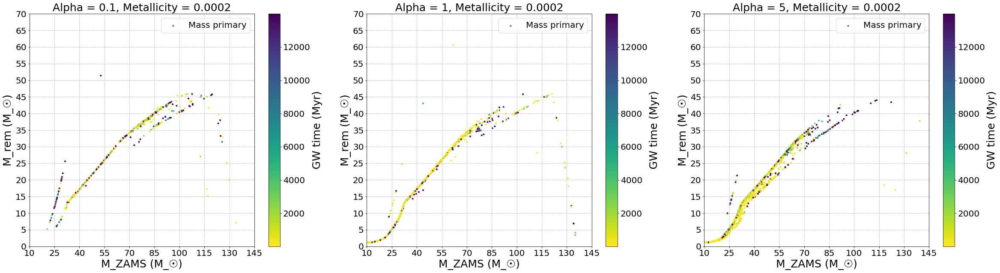

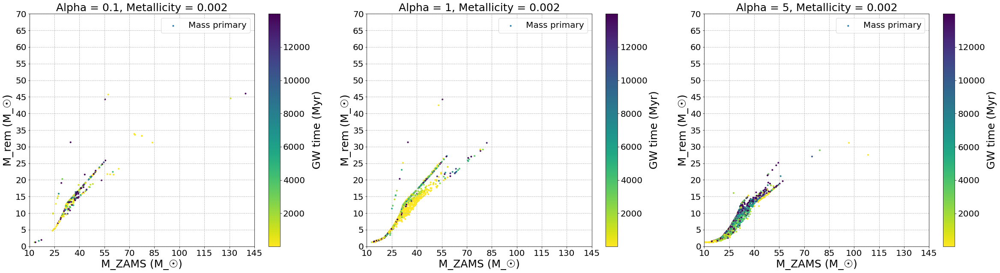

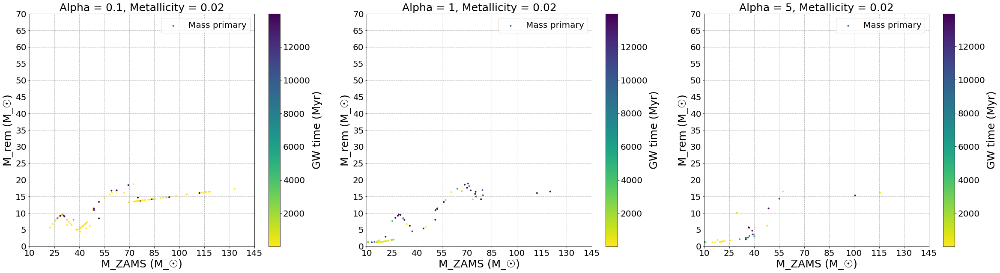

In [60]:
import matplotlib.pyplot as plt
import matplotlib 

Zs = [0.0002,0.002, 0.02] #Metallicity
As = [0.1, 1, 5] #alpha common envelope

#N = 2000


for z in Zs:
    i = 0
    
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (40,40/4))

    for a in As:
              
        
        df_output = df_end_interest_nm[df_end_interest_nm['Z'] == z]
        df_output = df_output[df_output['A'] == a]

        df_input = df_start_interest_nm[df_start_interest_nm['Z'] == z]
        df_input = df_input[df_input['A'] == a]
        
        
        df_input = df_input[df_output['Merge_time_midpoint'] < 14e3]
        df_output = df_output[df_output['Merge_time_midpoint'] < 14e3]
        
        df_output = df_output.sample(frac = 0.2, random_state = 6)
        df_input = df_input.sample(frac = 0.2, random_state = 6)
        

        ax[i].set_title('Alpha = ' +  str(a) + ', Metallicity = ' + str(z), fontsize = 25)
        s = ax[i].scatter(df_input.Mass_0, df_output.Mass_0,
                      label='Mass primary', marker = '.', alpha = 1,
                      c=df_output['Merge_time_midpoint'], cmap = 'viridis_r',
                      vmin=df_output['Merge_time_midpoint'].min(), vmax=df_output['Merge_time_midpoint'].max());
        
        ax[i].tick_params(axis = 'both', labelsize = 20)
        ax[i].set_xticks(np.arange(10,160,15))
        ax[i].set_yticks(np.arange(0,75,5))
        ax[i].grid(linestyle = '--', clip_on = False)
        ax[i].set_xlim(left=10,right=145)
        ax[i].set_ylim(bottom=0,top=70)
        ax[i].set_xlabel('M_ZAMS (M_☉)', fontsize = 25)
        ax[i].set_ylabel('M_rem (M_☉)', fontsize = 25)
        ax[i].legend(loc='best', fontsize = 20)  
        
        cbar = plt.colorbar(mappable = s, ax=ax[i])
        cbar.set_label('GW time (Myr)', fontsize = 25)
        cbar.ax.tick_params(labelsize=20)
        i += 1 
 

When we filter the plot for all the merging COBs wee see that the most recognizable pattern above disappears and that only small masses can be seen by GWs.

## Primary Mass of the COBs

The same considerations hold for the secondary mass.

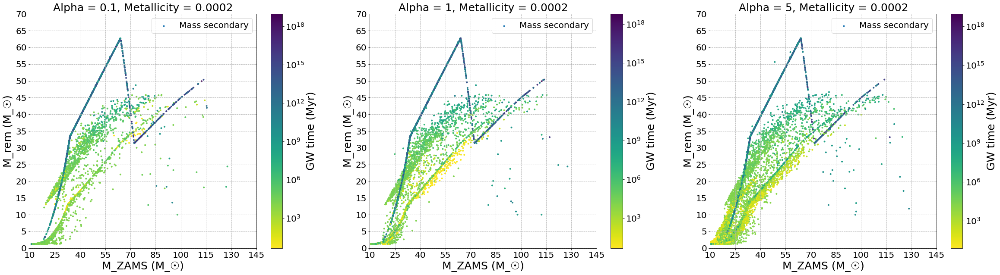

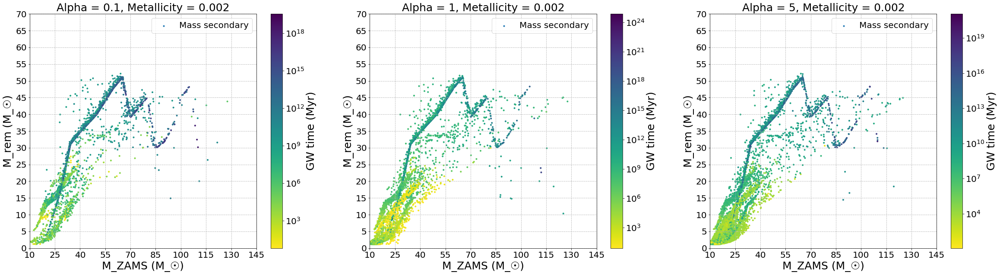

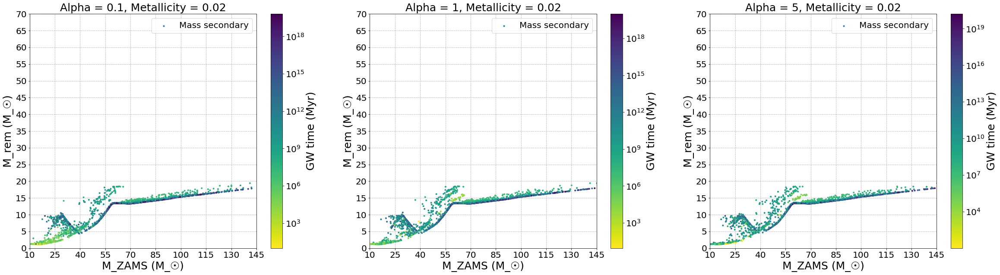

In [59]:
import matplotlib.pyplot as plt
import matplotlib 

Zs = [0.0002,0.002, 0.02] #Metallicity
As = [0.1, 1, 5] #alpha common envelope

#N = 2000


for z in Zs:
    i = 0
    
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (40,40/4))

    for a in As:
              
        
        df_output = df_end_interest_nm[df_end_interest_nm['Z'] == z]
        df_output = df_output[df_output['A'] == a]

        df_input = df_start_interest_nm[df_start_interest_nm['Z'] == z]
        df_input = df_input[df_input['A'] == a]
        
        
        df_input = df_input
        df_output = df_output
        
        df_output = df_output.sample(frac = 0.2, random_state = 6)
        df_input = df_input.sample(frac = 0.2, random_state = 6)
        

        ax[i].set_title('Alpha = ' +  str(a) + ', Metallicity = ' + str(z), fontsize = 25)
        s = ax[i].scatter(df_input.Mass_1, df_output.Mass_1,
                      label='Mass secondary', marker = '.', alpha = 1,
                      c=df_output['Merge_time_midpoint'], cmap = 'viridis_r',
                      norm=matplotlib.colors.LogNorm(
                          vmin=df_output['Merge_time_midpoint'].min(), vmax=df_output['Merge_time_midpoint'].max()));
        
        ax[i].tick_params(axis = 'both', labelsize = 20)
        ax[i].set_xticks(np.arange(10,160,15))
        ax[i].set_yticks(np.arange(0,75,5))
        ax[i].grid(linestyle = '--', clip_on = False)
        ax[i].set_xlim(left=10,right=145)
        ax[i].set_ylim(bottom=0,top=70)
        ax[i].set_xlabel('M_ZAMS (M_☉)', fontsize = 25)
        ax[i].set_ylabel('M_rem (M_☉)', fontsize = 25)
        ax[i].legend(loc='best', fontsize = 20)  
        
        cbar = plt.colorbar(mappable = s, ax=ax[i])
        cbar.set_label('GW time (Myr)', fontsize = 25)
        cbar.ax.tick_params(labelsize=20)
        i += 1 
 

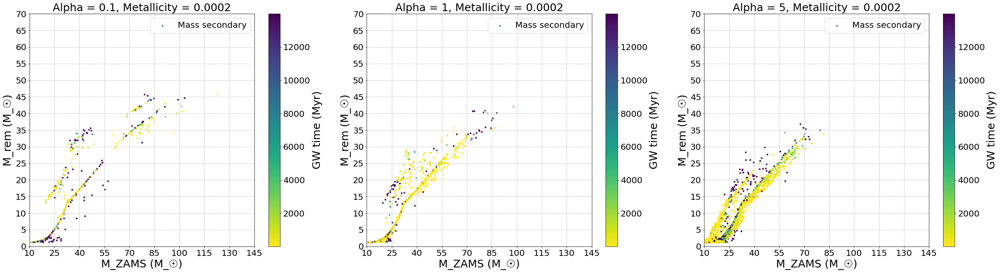

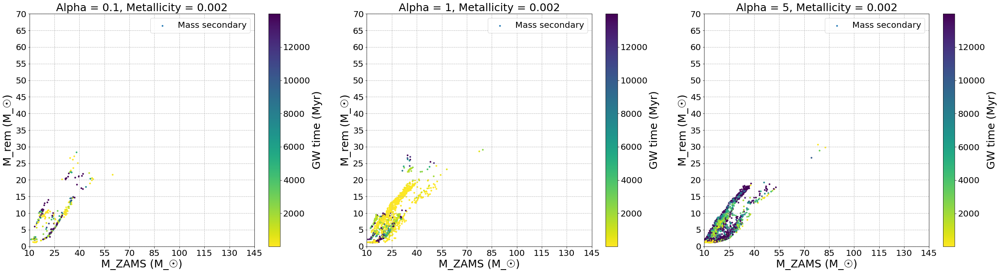

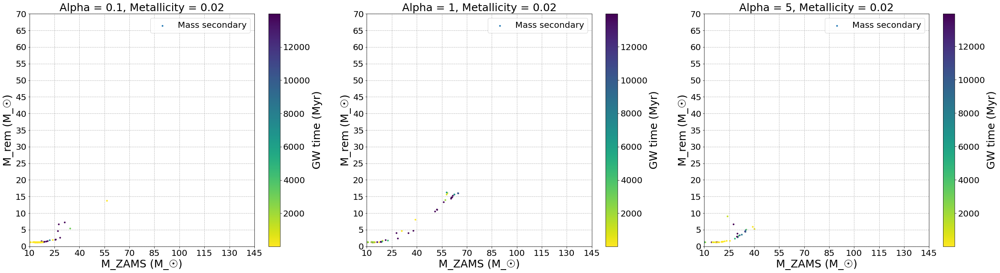

In [58]:
import matplotlib.pyplot as plt
import matplotlib 

Zs = [0.0002,0.002, 0.02] #Metallicity
As = [0.1, 1, 5] #alpha common envelope

#N = 2000


for z in Zs:
    i = 0
    
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (40,40/4))

    for a in As:
              
        
        df_output = df_end_interest_nm[df_end_interest_nm['Z'] == z]
        df_output = df_output[df_output['A'] == a]

        df_input = df_start_interest_nm[df_start_interest_nm['Z'] == z]
        df_input = df_input[df_input['A'] == a]
        
        
        df_input = df_input[df_output['Merge_time_midpoint'] < 14e3]
        df_output = df_output[df_output['Merge_time_midpoint'] < 14e3]
        
        df_output = df_output.sample(frac = 0.2, random_state = 6)
        df_input = df_input.sample(frac = 0.2, random_state = 6)
        

        ax[i].set_title('Alpha = ' +  str(a) + ', Metallicity = ' + str(z), fontsize = 25)
        s = ax[i].scatter(df_input.Mass_1, df_output.Mass_1,
                      label='Mass secondary', marker = '.', alpha = 1,
                      c=df_output['Merge_time_midpoint'], cmap = 'viridis_r',
                      vmin=df_output['Merge_time_midpoint'].min(), vmax=df_output['Merge_time_midpoint'].max());
        
        ax[i].tick_params(axis = 'both', labelsize = 20)
        ax[i].set_xticks(np.arange(10,160,15))
        ax[i].set_yticks(np.arange(0,75,5))
        ax[i].grid(linestyle = '--', clip_on = False)
        ax[i].set_xlim(left=10,right=145)
        ax[i].set_ylim(bottom=0,top=70)
        ax[i].set_xlabel('M_ZAMS (M_☉)', fontsize = 25)
        ax[i].set_ylabel('M_rem (M_☉)', fontsize = 25)
        ax[i].legend(loc='best', fontsize = 20)  
        
        cbar = plt.colorbar(mappable = s, ax=ax[i])
        cbar.set_label('GW time (Myr)', fontsize = 25)
        cbar.ax.tick_params(labelsize=20)
        i += 1 
 

## Semimajor Axis vs Remnant  Primary Mass

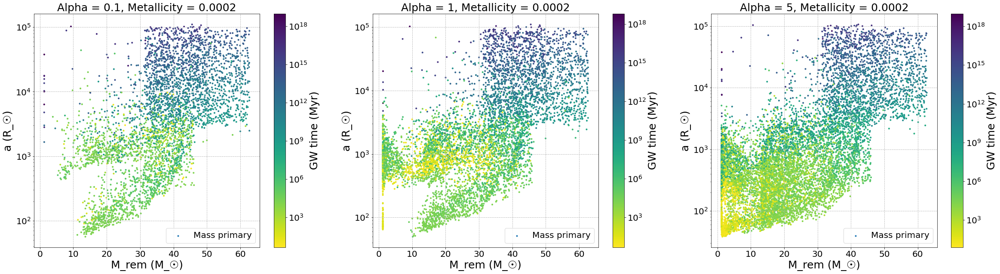

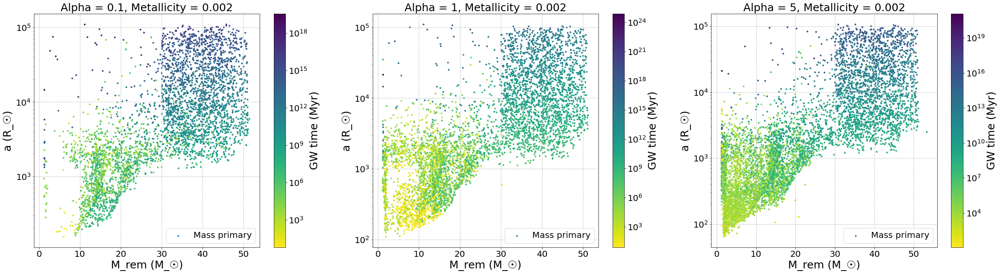

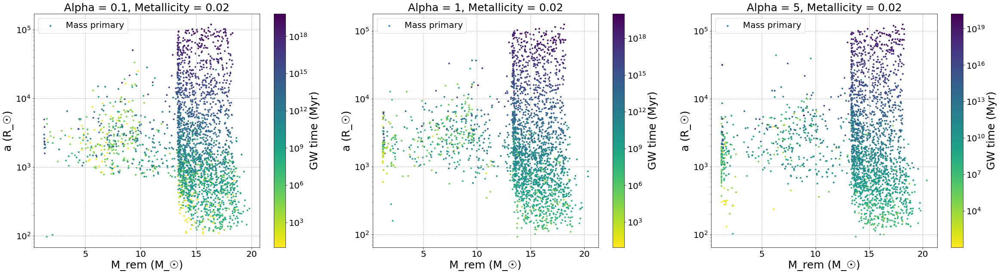

In [64]:
import matplotlib.pyplot as plt

Zs = [0.0002,0.002, 0.02] #Metallicity
As = [0.1, 1, 5] #alpha common envelope

#N = 2000


for z in Zs:
    
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (40,40/4))
    
    i = 0
    for a in As:
        
        
        df_output = df_end_interest_nm[df_end_interest_nm['Z'] == z]
        df_output = df_output[df_output['A'] == a]

        df_input = df_start_interest_nm[df_start_interest_nm['Z'] == z]
        df_input = df_input[df_input['A'] == a]
        
        
        df_input = df_input
        df_output = df_output
        
        df_output = df_output.sample(frac = 0.2, random_state = 6)
        df_input = df_input.sample(frac = 0.2, random_state = 6)
        

        ax[i].set_title('Alpha = ' +  str(a) + ', Metallicity = ' + str(z), fontsize = 25)
        s = ax[i].scatter(df_output.Mass_0, df_input.a, marker = '.', alpha = 1, label='Mass primary', c=df_output['Merge_time_midpoint'], cmap = 'viridis_r',
                      norm=matplotlib.colors.LogNorm(
                          vmin=df_output['Merge_time_midpoint'].min(), vmax=df_output['Merge_time_midpoint'].max()));
        ax[i].tick_params(axis = 'both', labelsize = 20)
        #ax[1].set_xticks(np.arange(10,160,15))
        ax[i].set_yscale('log')
        ax[i].grid(linestyle = '--', clip_on = False)
        #ax[1].set_xlim(left=10,right=145)
        #ax[1].set_ylim(bottom=0,top=70)
        ax[i].set_xlabel('M_rem (M_☉)', fontsize = 25)
        ax[i].set_ylabel('a (R_☉)', fontsize = 25)
        ax[i].legend(loc='best', fontsize = 20)   
        
        cbar = plt.colorbar(mappable = s, ax=ax[i])
        cbar.set_label('GW time (Myr)', fontsize = 25)
        cbar.ax.tick_params(labelsize=20)

        i += 1

For metallicity Z = 0.0002 and Z = 0.002 we can see a 'square' of points for hight semimajors and hight masses but with a hight GW time this means that we will not observe those stellar systems.

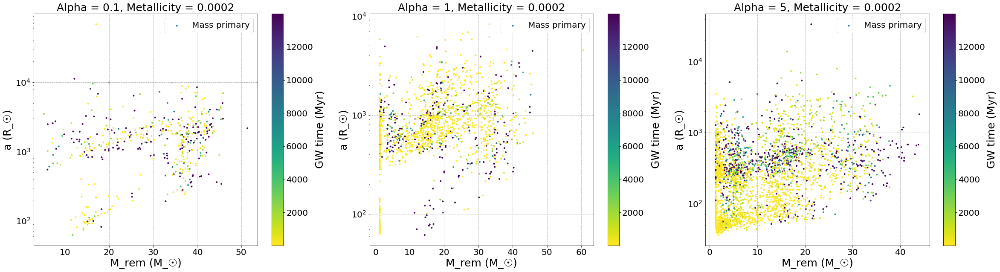

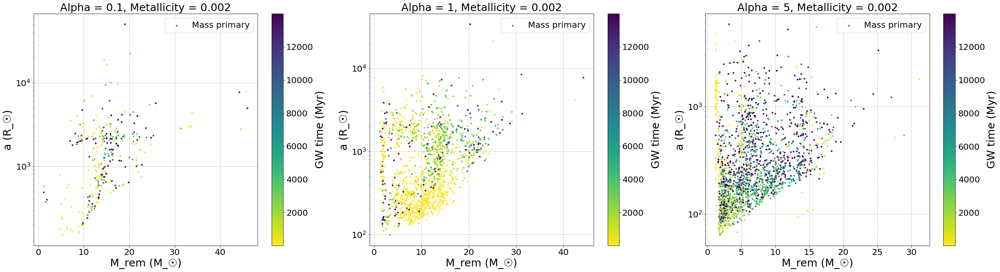

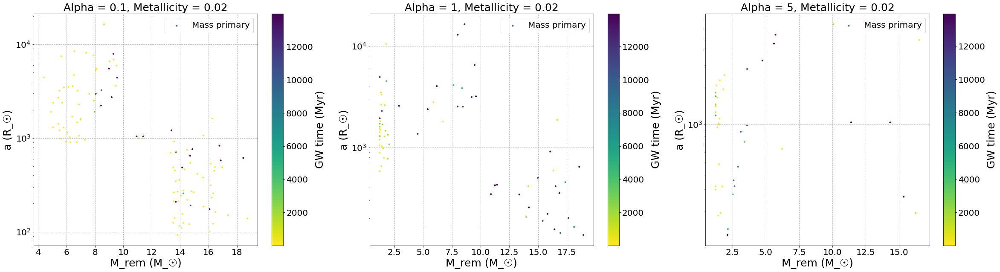

In [66]:
import matplotlib.pyplot as plt

Zs = [0.0002,0.002, 0.02] #Metallicity
As = [0.1, 1, 5] #alpha common envelope

#N = 2000


for z in Zs:
    
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (40,40/4))
    
    i = 0
    for a in As:
        
        
        df_output = df_end_interest_nm[df_end_interest_nm['Z'] == z]
        df_output = df_output[df_output['A'] == a]

        df_input = df_start_interest_nm[df_start_interest_nm['Z'] == z]
        df_input = df_input[df_input['A'] == a]
        
        
        df_input = df_input[df_output['Merge_time_midpoint'] < 14e3]
        df_output = df_output[df_output['Merge_time_midpoint'] < 14e3]
        
        df_output = df_output.sample(frac = 0.2, random_state = 6)
        df_input = df_input.sample(frac = 0.2, random_state = 6)
        

        ax[i].set_title('Alpha = ' +  str(a) + ', Metallicity = ' + str(z), fontsize = 25)
        s = ax[i].scatter(df_output.Mass_0, df_input.a, marker = '.', alpha = 1, label='Mass primary', c=df_output['Merge_time_midpoint'], cmap = 'viridis_r',
                      vmin=df_output['Merge_time_midpoint'].min(), vmax=df_output['Merge_time_midpoint'].max());
        ax[i].tick_params(axis = 'both', labelsize = 20)
        #ax[1].set_xticks(np.arange(10,160,15))
        ax[i].set_yscale('log')
        ax[i].grid(linestyle = '--', clip_on = False)
        #ax[1].set_xlim(left=10,right=145)
        #ax[1].set_ylim(bottom=0,top=70)
        ax[i].set_xlabel('M_rem (M_☉)', fontsize = 25)
        ax[i].set_ylabel('a (R_☉)', fontsize = 25)
        ax[i].legend(loc='best', fontsize = 20)   
        
        cbar = plt.colorbar(mappable = s, ax=ax[i])
        cbar.set_label('GW time (Myr)', fontsize = 25)
        cbar.ax.tick_params(labelsize=20)

        i += 1

It's possible to observe for Z = 0.02 stellar systems in the bottom right of the Semimajor vs Semnant Mass plot; in particular the probability of observing those systems decrease when alpha increase.

## Semimajor Axis vs Remnant  Secondary Mass

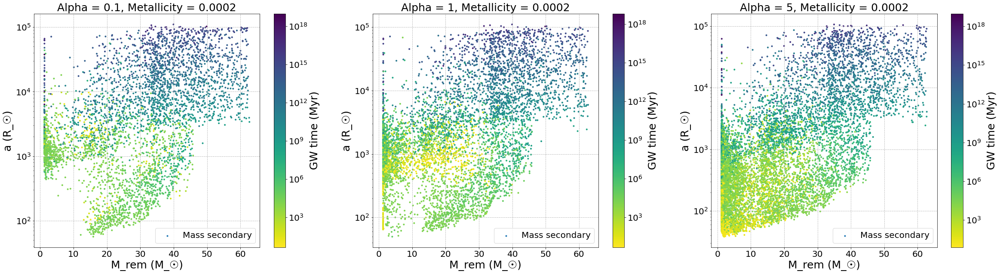

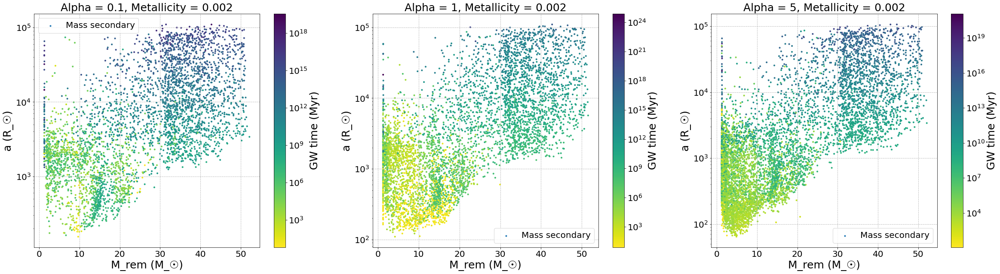

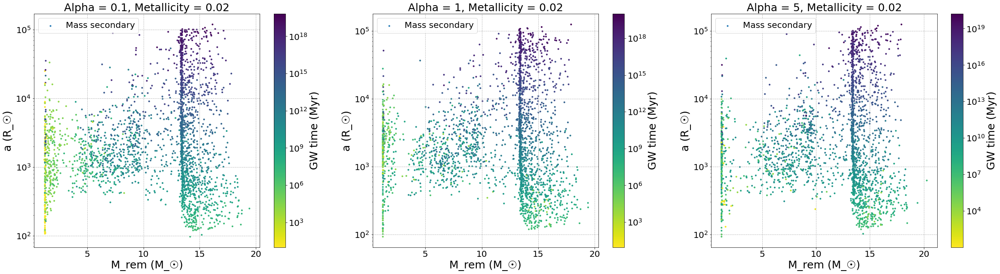

In [67]:
import matplotlib.pyplot as plt

Zs = [0.0002,0.002, 0.02] #Metallicity
As = [0.1, 1, 5] #alpha common envelope

#N = 2000


for z in Zs:
    
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (40,40/4))
    
    i = 0
    for a in As:
        
        
        df_output = df_end_interest_nm[df_end_interest_nm['Z'] == z]
        df_output = df_output[df_output['A'] == a]

        df_input = df_start_interest_nm[df_start_interest_nm['Z'] == z]
        df_input = df_input[df_input['A'] == a]
        
        
        df_input = df_input
        df_output = df_output
        
        df_output = df_output.sample(frac = 0.2, random_state = 6)
        df_input = df_input.sample(frac = 0.2, random_state = 6)
        

        ax[i].set_title('Alpha = ' +  str(a) + ', Metallicity = ' + str(z), fontsize = 25)
        s = ax[i].scatter(df_output.Mass_1, df_input.a, marker = '.', alpha = 1, label='Mass secondary', c=df_output['Merge_time_midpoint'], cmap = 'viridis_r',
                      norm=matplotlib.colors.LogNorm(
                          vmin=df_output['Merge_time_midpoint'].min(), vmax=df_output['Merge_time_midpoint'].max()));
        ax[i].tick_params(axis = 'both', labelsize = 20)
        #ax[1].set_xticks(np.arange(10,160,15))
        ax[i].set_yscale('log')
        ax[i].grid(linestyle = '--', clip_on = False)
        #ax[1].set_xlim(left=10,right=145)
        #ax[1].set_ylim(bottom=0,top=70)
        ax[i].set_xlabel('M_rem (M_☉)', fontsize = 25)
        ax[i].set_ylabel('a (R_☉)', fontsize = 25)
        ax[i].legend(loc='best', fontsize = 20)   
        
        cbar = plt.colorbar(mappable = s, ax=ax[i])
        cbar.set_label('GW time (Myr)', fontsize = 25)
        cbar.ax.tick_params(labelsize=20)

        i += 1

In these plots like in those with the primary mass we can note that for Z = 0.0002 and 0.002 there is an hypotetical curve below wich thare are no systems. 

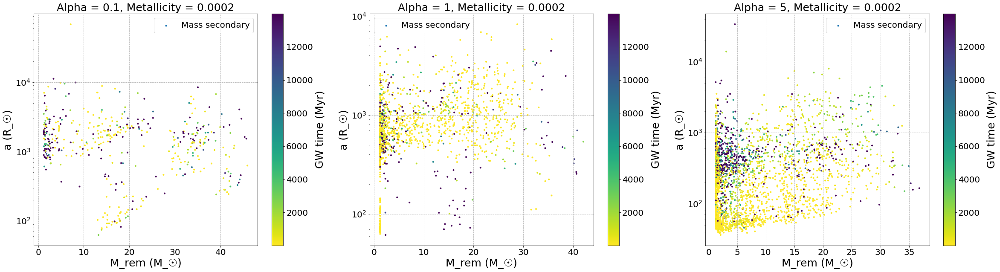

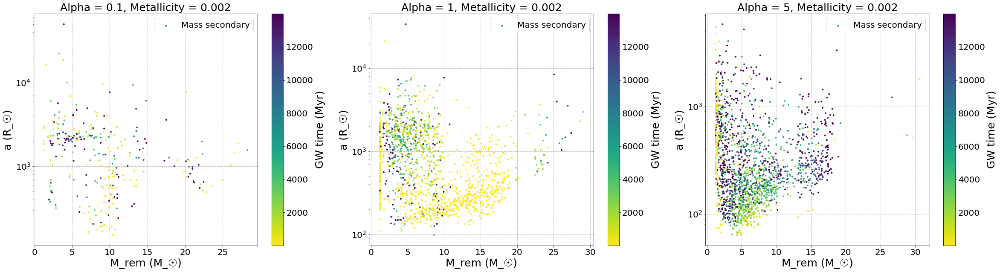

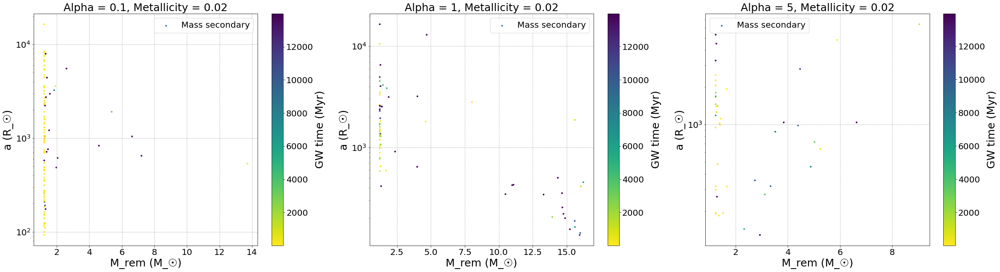

In [68]:
import matplotlib.pyplot as plt

Zs = [0.0002,0.002, 0.02] #Metallicity
As = [0.1, 1, 5] #alpha common envelope

#N = 2000

for z in Zs:
    
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (40,40/4))
    
    i = 0
    for a in As:
        
        
        df_output = df_end_interest_nm[df_end_interest_nm['Z'] == z]
        df_output = df_output[df_output['A'] == a]

        df_input = df_start_interest_nm[df_start_interest_nm['Z'] == z]
        df_input = df_input[df_input['A'] == a]
        
        
        df_input = df_input[df_output['Merge_time_midpoint'] < 14e3]
        df_output = df_output[df_output['Merge_time_midpoint'] < 14e3]
        
        df_output = df_output.sample(frac = 0.2, random_state = 6)
        df_input = df_input.sample(frac = 0.2, random_state = 6)
        

        ax[i].set_title('Alpha = ' +  str(a) + ', Metallicity = ' + str(z), fontsize = 25)
        s = ax[i].scatter(df_output.Mass_1, df_input.a, marker = '.', alpha = 1, label='Mass secondary', c=df_output['Merge_time_midpoint'], cmap = 'viridis_r',
                      vmin=df_output['Merge_time_midpoint'].min(), vmax=df_output['Merge_time_midpoint'].max());
        ax[i].tick_params(axis = 'both', labelsize = 20)
        #ax[1].set_xticks(np.arange(10,160,15))
        ax[i].set_yscale('log')
        ax[i].grid(linestyle = '--', clip_on = False)
        #ax[1].set_xlim(left=10,right=145)
        #ax[1].set_ylim(bottom=0,top=70)
        ax[i].set_xlabel('M_rem (M_☉)', fontsize = 25)
        ax[i].set_ylabel('a (R_☉)', fontsize = 25)
        ax[i].legend(loc='best', fontsize = 20)   
        
        cbar = plt.colorbar(mappable = s, ax=ax[i])
        cbar.set_label('GW time (Myr)', fontsize = 25)
        cbar.ax.tick_params(labelsize=20)

        i += 1

For the secondary mass the bottom right face of the plots for Z = 0.02 presents the majority of the stystems for  Alpha = 1 and we lost that decreasing behaviour that we observed for the primary mass.

## Eccentricity vs Semimajor Axis

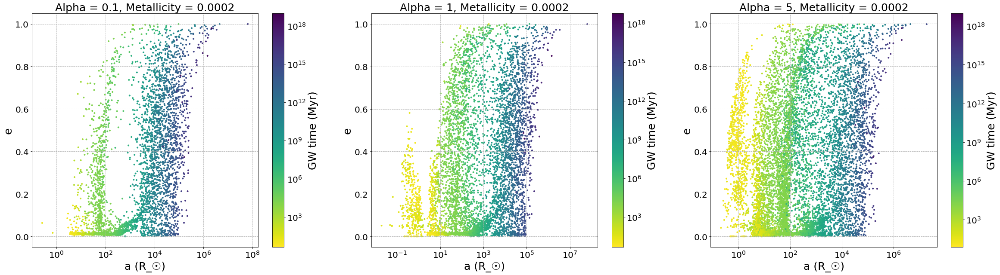

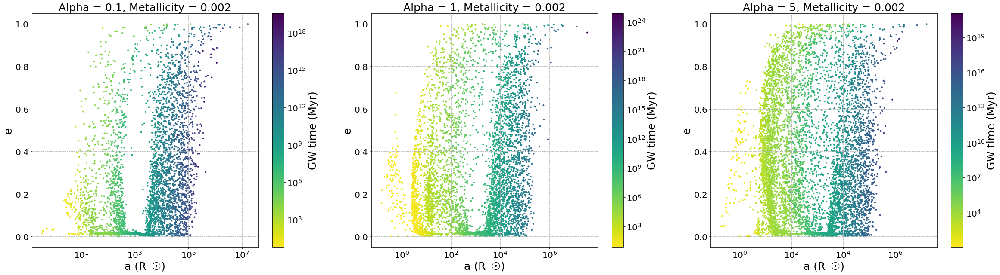

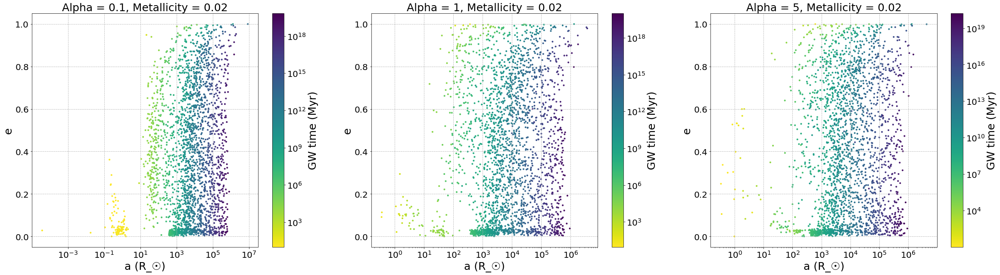

In [70]:
import matplotlib.pyplot as plt

Zs = [0.0002,0.002, 0.02] #Metallicity
As = [0.1, 1, 5] #alpha common envelope

#N = 2000


for z in Zs:
    
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (40,40/4))
    
    i = 0
    for a in As:
        
        
        df_output = df_end_interest_nm[df_end_interest_nm['Z'] == z]
        df_output = df_output[df_output['A'] == a]

        df_input = df_start_interest_nm[df_start_interest_nm['Z'] == z]
        df_input = df_input[df_input['A'] == a]
        
        
        df_input = df_input
        df_output = df_output
        
        df_output = df_output.sample(frac = 0.2, random_state = 6)
        df_input = df_input.sample(frac = 0.2, random_state = 6)
        

        ax[i].set_title('Alpha = ' +  str(a) + ', Metallicity = ' + str(z), fontsize = 25)
        s = ax[i].scatter(df_output.Semimajor, df_output.Eccentricity, marker = '.', alpha = 1, c=df_output['Merge_time_midpoint'], cmap = 'viridis_r',
                      norm=matplotlib.colors.LogNorm(
                          vmin=df_output['Merge_time_midpoint'].min(), vmax=df_output['Merge_time_midpoint'].max()));
        ax[i].tick_params(axis = 'both', labelsize = 20)
        ax[i].set_xscale('log')
        #ax[1].set_yticks(np.arange(0,75,5))
        ax[i].grid(linestyle = '--', clip_on = False)
        #ax[1].set_xlim(left=10,right=145)
        #ax[1].set_ylim(bottom=0,top=70)
        ax[i].set_xlabel('a (R_☉)', fontsize = 25)
        ax[i].set_ylabel('e', fontsize = 25)
 
        
        cbar = plt.colorbar(mappable = s, ax=ax[i])
        cbar.set_label('GW time (Myr)', fontsize = 25)
        cbar.ax.tick_params(labelsize=20)

        i += 1

Here we can see how the Eccentricity vs Semimajor pattern depends on all the possible combination of A and Z. For Z = 0.0002 and Z = 0.002 we can see more clearly that exists an intermediate value for the semiaxis where we do not observe systems.

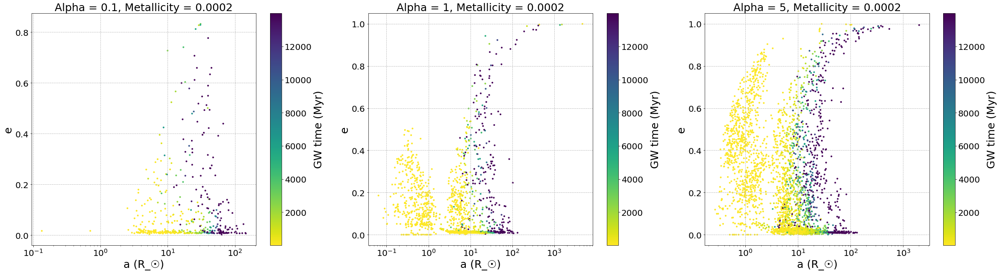

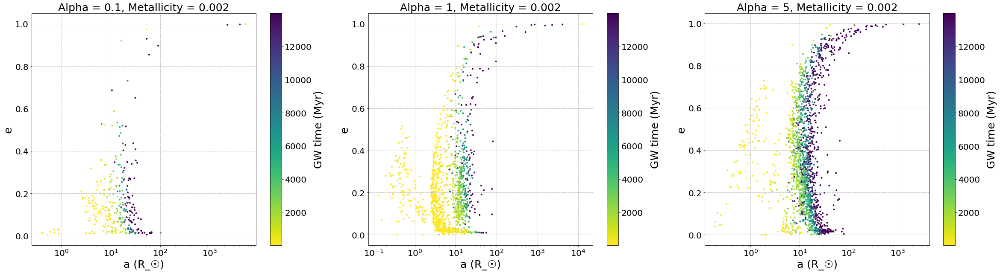

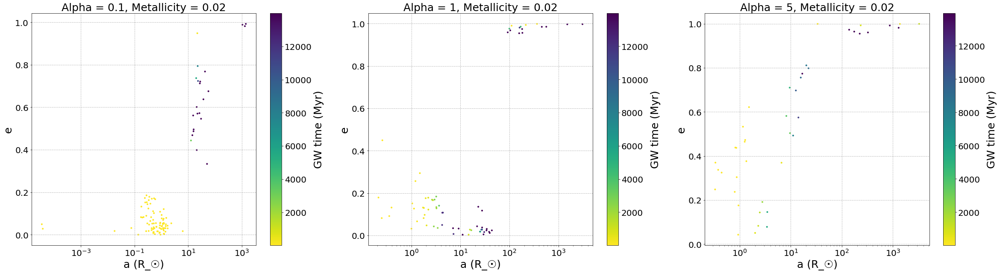

In [72]:
import matplotlib.pyplot as plt

Zs = [0.0002,0.002, 0.02] #Metallicity
As = [0.1, 1, 5] #alpha common envelope

#N = 2000


for z in Zs:
    
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (40,40/4))
    
    i = 0
    for a in As:
        
        
        df_output = df_end_interest_nm[df_end_interest_nm['Z'] == z]
        df_output = df_output[df_output['A'] == a]

        df_input = df_start_interest_nm[df_start_interest_nm['Z'] == z]
        df_input = df_input[df_input['A'] == a]
        
        
        df_input = df_input[df_output['Merge_time_midpoint'] < 14e3]
        df_output = df_output[df_output['Merge_time_midpoint'] < 14e3]
        
        df_output = df_output.sample(frac = 0.2, random_state = 6)
        df_input = df_input.sample(frac = 0.2, random_state = 6)
        

        ax[i].set_title('Alpha = ' +  str(a) + ', Metallicity = ' + str(z), fontsize = 25)
        s = ax[i].scatter(df_output.Semimajor, df_output.Eccentricity, marker = '.', alpha = 1, c=df_output['Merge_time_midpoint'], cmap = 'viridis_r',
                      vmin=df_output['Merge_time_midpoint'].min(), vmax=df_output['Merge_time_midpoint'].max());
        ax[i].tick_params(axis = 'both', labelsize = 20)
        ax[i].set_xscale('log')
        #ax[1].set_yticks(np.arange(0,75,5))
        ax[i].grid(linestyle = '--', clip_on = False)
        #ax[1].set_xlim(left=10,right=145)
        #ax[1].set_ylim(bottom=0,top=70)
        ax[i].set_xlabel('a (R_☉)', fontsize = 25)
        ax[i].set_ylabel('e', fontsize = 25)
 
        
        cbar = plt.colorbar(mappable = s, ax=ax[i])
        cbar.set_label('GW time (Myr)', fontsize = 25)
        cbar.ax.tick_params(labelsize=20)

        i += 1

When we filter for only detectable COBs we see those strange 'wave' patterns.

# Analyzing the relation between $Z$, $\alpha$ and "merger/no merger" using information theory

In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
from itertools import product 

## Introduction
There are many ways to graphically analyze the dependence between $Z$, $\alpha$ and whether or not a merger occurs, but how do we find a quantitative one? It would be very useful to have a more general version of the linear correlation coefficient, a quantity e.g. equal to 0 when our variables are fully independent (not just in a linear way) and equal to 1 when they are fully dependent in a any arbitrary way.              
Fortunately such a quantity can easily be constructed using information theory, as long as we model our problem *probabilistically*.
### Probabilistic view of the merger problem 
If we had perfect knowledge about every property of a binary we would obviously be able to predict deterministically whether or not a merger will occur, but this prediction is of course impossible in practice due to the limited amount of information at our disposal. We quantify the uncertainty consequence of this ignorance using a bayesian definition of probabilities as follows: if $X$ is the boolean variable equal to true/false if a merger occurs/doesn't occur respectively then we may say that $X$ is a *random variable*, meaning that given any binary system we can only assign some probability to the event "this binary will merge" (representing the current state of our knowledge). 
### Shannon entropy
Let's now say that the variable $Y$ represents the pair $(Z, \alpha)$; our problem is then to estimate if knowing the value taken on by $Y$ can reduce the uncertainty associated to the value $X$ itself will take on. This problem can be tackled using information theory as follows.           
Imagine we have a discrete random variable $X$, capable of taking on the values $x_i$'s, and that which $x_i$ will be "chosen" is unknown not necessarily because of an intrinstic stochasticity but due to a lack of "predictive" knowledge. Then we can measure the "surprise" associated to observing $X$ take on any of the $x_i$'s using *Shannon entropy*, defined as follows:
\begin{equation}
  S(X) = -\sum_i p(x_i)\log_2 (p(x_i))
\end{equation}
Why this quantity is able to adequately express "surprise" is easily seen with some examples. Imagine that $X$ is actually not random, and therefore that it will be equal to $x_1$ with probability 1 (for example); this means that every other probability is zero, and by inspecting the definition one immediately finds that $S$ must equal 0. A similar result holds if $X$ is only slightly random; if one probability is very close to 1 and every other to 0 then each term in the sum will be negliglible. See the graph below to understand why this is true.

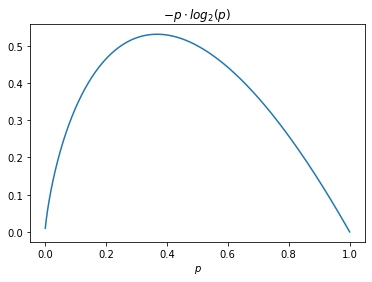

In [34]:
p_plot = np.linspace(0.001, 1, 1000)
plt.plot(p_plot, -p_plot*np.log2(p_plot))
plt.title('$-p \cdot log_2(p)$');
plt.xlabel('$p$');
# p_i close to 0 or 1 yields S_i close to 0

If instead we have a "very random" variable we must therefore have that each $p_i$ is approximately equal to each other, so that one can never have any idea which $x_i$ will be observed. In this case we are in the middle portion of the above graph, which means every term in the sum is significantly different from zero - which in turn means that $S$ becomes large.          
Notice that when one uses the base-2 log entropy is measured in "bits".
### Mutual information
Let's now introduce our second variable $Y$ and ask: "how much can we reduce the surprise associated to $X$ (as measured by the Shannon entropy) if we state in advance that $Y$ is equal to a particular $y_i$?"
The answer to this question turns out to be *mutual information*, defined as 
\begin{equation}
  I(X; Y) = \sum_{y \in \mathcal{Y}} \sum_{x \in \mathcal{X}} p_{X,Y}(x,y) \log_2\left(\frac{p_{X,Y}(x,y)}{p_X(x)p_Y(y)}\right)
\end{equation}
once again measured in bits. Notice that this is just the Kullback-Leibler divergence between the joint distribution $p_{X,Y}(x,y)$ and the product of its two marginals $p_X(x)$, $p_{Y}(y)$; why we want to compare these two quantities is easily seen. Indeed notice that if $X$ and $Y$ are truly independent then $p_{X,Y}(x,y) = p_X(x)p_Y(y)$, which makes $I=0$ - just like the linear correlation coefficient, but in a full general way! If instead the two variables are dependent we will have not only that $p_{X,Y}(x,y) \neq p_X(x)p_Y(y)$, but also that these two distributions will differ more and more. Since the KL divergence gives a way of comparing similarity between distribution in a metric-like fashion we see that $I$ is large when the two distributions are very "distant", and zero when they're identical.             
**To recap:** the information shared between two random variables is the *extra* information in the joint pdf, beyond what's in the product of the two marginals; this "distribution dissimilarity" is what we compute with the mutual information.                    
From the above definitions plus the properties of the logarithm one [easily finds](https://en.wikipedia.org/wiki/Mutual_information#Relation_to_conditional_and_joint_entropy):
\begin{equation}
  I(X; Y) = S(X) - S(X|Y) \implies S'(X) \equiv S(X|Y) = S(X) - I(X; Y)
\end{equation}
where we implicitly assumed that by stating $Y$'s value one goes from $S(X)$ to $S'(X) = S(X|Y)$.

#### What about scale?
Since $I$ is not measured in familiar units it's not trivial how one would interpret its numerical value; fortunately in our case it's easy to normalize $I$ so that it has no units and lies in the $[0,1]$ interval. Indeed notice that $S_X$ gives us a scale; by comparing $I$ or $S'_X = S_X + \Delta S = S_X-I$ with $S_X$ we can construct a dimensionless ratio between 0 and 1 since in general $0\leq I \leq S_X$ - and this quantity will therefore a similar, but more general interpretation to the linear correlation coefficient!                  
Therefore we need to do two things:
- construct the relevant distributions;
- compute 
\begin{equation}
  \frac{I}{S_X} \quad \text{and/or} \quad \frac{S_X-I}{S_X} = 1 - \frac{I}{S_X}
\end{equation}
Either of these values works just as fine as our nonlinear correlation coefficient. The first lets us state "we reduced the entropy by $I/S_X$", whereas the second "the new entropy is $1 - I/S_X$ times the original number of bits".

In [4]:
# first we read the data and construct the values taken on by Y; these simply are all the possible (Z,A) pairs, of which there are 9 in our dataset
df = pd.read_csv("df1_mid.csv")

Z_values, A_values = np.unique(df.Z), np.unique(df.A)
ZA = list(product(Z_values, A_values))
print(ZA)

[(0.0002, 0.1), (0.0002, 1.0), (0.0002, 5.0), (0.002, 0.1), (0.002, 1.0), (0.002, 5.0), (0.02, 0.1), (0.02, 1.0), (0.02, 5.0)]


In [5]:
# We now want to create our joint distribution as a 2x9 matrix; each row will represent one possible value of X, an so on for the columns and Y.
# These two rows can be computed by counting how many rows havve that value of X and Y wrt the total.

p = np.zeros(len(ZA)) # probabilities vector for mergers
p2 = np.zeros(len(ZA)) # ...for no-mergers

df_merge = df[df.BWorldtime + df.Merge_time_midpoint < 14e3]
print("n. of mergers:", len(df_merge))
print(f"fraction of mergers wrt total: {len(df_merge)/len(df):%}")

df_no_merge = df[df.BWorldtime + df.Merge_time_midpoint > 14e3]

for i, tup in enumerate(product(Z_values, A_values)) :
    Z, A = tup
    p[i] = len(df_merge[(df_merge.Z == Z) & (df_merge.A == A)])/len(df) 
    p2[i] = len(df_no_merge[(df_no_merge.Z == Z) & (df_no_merge.A == A)])/len(df)
    print(f"merge prob. for (Z,A) = {tup}: {p[i]}") 

print("\n")
print("prob. vec. for mergers:", p, '\n')
print("prob. vec. for no-mergers:", p2)

n. of mergers: 42442
fraction of mergers wrt total: 18.449033%
merge prob. for (Z,A) = (0.0002, 0.1): 0.009337100630297761
merge prob. for (Z,A) = (0.0002, 1.0): 0.030454249076287764
merge prob. for (Z,A) = (0.0002, 5.0): 0.06350358617691806
merge prob. for (Z,A) = (0.002, 0.1): 0.006350793305803086
merge prob. for (Z,A) = (0.002, 1.0): 0.030901977830906324
merge prob. for (Z,A) = (0.002, 5.0): 0.03923929580525973
merge prob. for (Z,A) = (0.02, 0.1): 0.002329928276461639
merge prob. for (Z,A) = (0.02, 1.0): 0.001469245816126929
merge prob. for (Z,A) = (0.02, 5.0): 0.0009041512714627255


prob. vec. for mergers: [0.0093371  0.03045425 0.06350359 0.00635079 0.03090198 0.0392393
 0.00232993 0.00146925 0.00090415] 

prob. vec. for no-mergers: [0.08447294 0.11858292 0.16730276 0.08061291 0.09047164 0.11656596
 0.05324929 0.0522669  0.05198435]


In [6]:
# now that we have the two rows separately we can vstack them to obtain the needed matrix
joint_pmf = np.vstack((p, p2))
print(joint_pmf)
print('joint pdf normalization:', joint_pmf.sum()) # sanity check

[[0.0093371  0.03045425 0.06350359 0.00635079 0.03090198 0.0392393
  0.00232993 0.00146925 0.00090415]
 [0.08447294 0.11858292 0.16730276 0.08061291 0.09047164 0.11656596
  0.05324929 0.0522669  0.05198435]]
joint pdf normalization: 1.0


In [7]:
# remember that X = merge, Y = (Z,A)
# since we are working with discrete distributions to obtain the two marginals it suffices to sum along the rows/columns of our matrix
pdf_X = joint_pmf.sum(axis = 1)
pdf_Y = joint_pmf.sum(axis = 0)
print(pdf_X.shape[0], pdf_Y.shape[0])
print("marginal X:", pdf_X)
print("marginal Y:", pdf_Y)

2 9
marginal X: [0.18449033 0.81550967]
marginal Y: [0.09381004 0.14903717 0.23080635 0.0869637  0.12137361 0.15580526
 0.05557922 0.05373614 0.0528885 ]


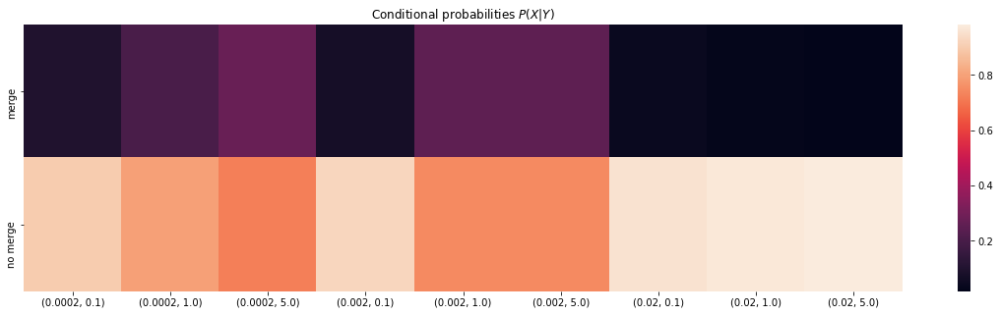

In [32]:
# before proceeding note that of course there are other uses to these distributions, such as computing the conditionals P(X|Y) i.e. the probabilities that a merger will occur with some specified values for Z and A
fig, ax = plt.subplots(figsize = (20, 5))
sns.heatmap(joint_pmf/pdf_Y, ax = ax)
ax.set_title('Conditional probabilities $P(X|Y)$')
ax.set_yticklabels(['merge', 'no merge'])
ax.set_xticklabels(ZA);

In [9]:
# Now we proceed with I's computation

# notice that the values taken on by the p(x)p(y) term in the determinator in Y can be computed all at once, since the associated distribution p(X)p(Y) is the outer product
# of the two marginals computed above
prod_pdf = np.outer(pdf_X, pdf_Y)
I = (np.log2(joint_pmf/prod_pdf)*joint_pmf).sum() # I's definition
print("mutual information between X and Y:", I)

mutual information between X and Y: 0.05190732771384882


In [10]:
ent_X = -(np.log2(pdf_X)*pdf_X).sum() # we compute X's original entropy to compare it with I
print("entropy of X:", ent_X)

entropy of X: 0.6898022997106766


In [11]:
ent_Y = -(np.log2(pdf_Y)*pdf_Y).sum()
print("entropy of Y:", ent_Y)

entropy of Y: 2.9940494771650528


In [12]:
# S_X' = S_X - I, because by specifying that (Z,A) took on a particular value can reduce the indetermination over X given that X and Y are correlated in some way. For example we know that some Z,A values are better than others at leading to a merger, hence if we know that Y equals to one of these lucky pairs then we can be more certain that X may be true - thus reducing "surprise" upon seeing the result.

print(f"Of the {ent_X:.3f} bits of information associated to the indetermination over X approx. {I:.3f} are shared with the {ent_Y:.3f} bits of Y's entropy.")
print(f"This means that by specifying (Z,A)'s value we reduce the indetermination over X = merge/no merge by approx. {I/ent_X:.3%} wrt its original entropy value")
print(f"To put this in another way: S_X'/S_X = {(1 - I/ent_X):.3%}")

Of the 0.690 bits of information associated to the indetermination over X approx. 0.052 are shared with the 2.994 bits of Y's entropy.
This means that by specifying (Z,A)'s value we reduce the indetermination over X = merge/no merge by approx. 7.525% wrt its original entropy value
To put this in another way: S_X'/S_X = 92.475%


## Beyond a frequentist computation: the bayesian approach
There is an interesting way to improve the above pipeline, which is to replace a frequentist computation of probabilities with a bayesian one. This is a desirable thing to do because by computing probabilities as n. of successess/n. total we are almost guaranteeing that if we repeat our "experiment" we will observe different values; this wouldn't be an issue if we could estimate some errors/intervals for e.g. the conditionals, but this is never trivial, general or intuitive enough in a frequentist setting - or at least not as much as it is in a bayesian one, where the posterior alone contains everything we could possibly need.                      
To setup a bayesian approach we first need to observe that if we think of $X$ and $Y$ as variables generated by an unknown likelihood then it's clear that with our limited $(Z,\alpha)$ resolution this likelihood is a *multinomial*, where every "slot" corresponds to one "experimental" bin. This multinomial's parameters are unknown; before we obtained a single estimate for them using the frequentist MLE estimator (cfr [here](https://math.stackexchange.com/a/421838)), but now we learn this likelihood using the so called *Dirichlet process*. With this we mean that since the Dirichlet distribution is the multinomial's conjugate prior (similarly to binomial/beta, which are respectively special cases of multinomial/Dirichlet) one can easily obtain the posterior over the $p_i$'s as a Dirichlet distribution, computed using some simple update rules starting e.g. from a uniform prior (i.e. a Dirichlet with all ones); in particular one finds that if the prior is a Dirichlet with $\alpha_i$ as parameters then the posterior will have $\alpha_i + n_i$ as parameters, where $n_i$ is the number of occurrences of $i$ (cfr [here](https://en.wikipedia.org/wiki/Conjugate_prior)).         

In [19]:
# in our case given a uniform prior (i.e. Dirichlet with all ones) the posterior is a Dirichlet with the following parameters
alpha = (joint_pmf*len(df)).astype(int) + 1
print(alpha)

[[ 2149  7007 14610  1462  7110  9028   537   339   209]
 [19434 27281 38489 18546 20814 26817 12251 12025 11960]]


In [29]:
alpha_new = np.zeros(shape = alpha.flatten().shape)
for i in range(len(alpha.flatten())):
    alpha_new[i] = np.random.dirichlet(alpha.flatten(),size=10000)[:,i].max()
alpha_new = alpha_new.reshape(joint_pmf.shape)

The function `numpy.random.dirichlet` samples 18-dimensional points from a Dirichlet pdf with parameters $\alpha_i$. In order to build the whole posterior distribution for the eighteen "bins" of the joint probability we sampled ten thousand points for each $\alpha_i$ and as a MAP estimator we used the mode for each group of sampled points (one group corresponds to drawing the k-th element of an 18D point ten thousand times).
<br> Since we do not know the functional explicit dependence between merging information and $Z,\alpha$ value we considered a uniform prior. This leads approximately, unless for some noise due to stochasticity in drawing samples, to the same joint probability we started from with MLE estimators for $p_i$'s. 

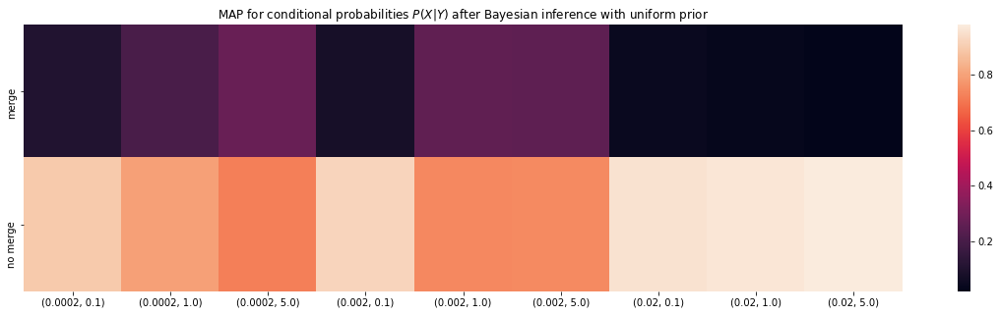

In [31]:
joint_pmf1 = alpha_new
pdf_Y1 = joint_pmf1.sum(axis = 0)
fig, ax = plt.subplots(figsize = (20, 5))
sns.heatmap(joint_pmf1/pdf_Y1, ax = ax)
ax.set_title('MAP for conditional probabilities $P(X|Y)$ after Bayesian inference with uniform prior')
ax.set_yticklabels(['merge', 'no merge'])
ax.set_xticklabels(ZA);

Each point in the 18D space where the Dirichlet distribution is defined represents a 18-tuple of values to be used as parameters for the multinomial likelihood; a simple way to use this information would be to for example construct a region around the mode such that its integral equals 95% prob. (cfr `scipy.integrate.nquad`), then use this region to assign error bars to each $p_i$ - themselves set equal to the coordinates of the posterior's maximum. This is already very interesting as it gives us a mean of trusting more our results (since in a sense they depend less on the dataset), but can also be used in relation to our mutual information problem. Indeed if we have a 18D range where most plausible values lie we can compute our "nonlinear correlation coefficient" for many values and see the resulting distribution; in particular we could see what's the "score" associated to the most likely candidates, etc.

The only nontrivial part about the outlined plan is how to "move" and integrate in 18D, which is quite hard to imagine, in a way which is general and scales to an arbitrary $n$ (as this would be needed if we decided to enrich our dataset with more $Z$ and/or $\alpha$ values). Since we are satisfied with the results already at hand we chose not to pursue this idea any further, rather leaving it as a suggestion for future studies.

The only nontrivial part about the outlined plan is how to "move" and integrate in 9D, which is quite hard to imagine, in a way which is general and scales to an arbitrary $n$ (as this would be needed if we decided to enrich our dataset with more $Z$ and/or $\alpha$ values). Since we are satisfied with the results already at hand we chose not to pursue this idea any further, rather leaving it as a suggestion for future studies.